# Plot Graphs:

### Authors : Daniel (UFRN), Vicente Sousa (UFRN)


## Directory

In [1]:
# Changing Working Directory - Linux
#opath = "/home/marilia/Plots/" 
#path =  "/home/marilia/Plots/" 

opath = "/home/william/Plots/" 
path =  "/home/william/Plots/" 


# "/home/william/ns-3/ns-allinone-3.37/ns-3.37/results_local_NrMmtc_SimPerScriptCampaign_SimTest_lambda/"

%cd $path

/home/william/Plots


## Script

In [2]:
%cd $opath"ScriptsPlot"

/home/william/Plots/ScriptsPlot


In [5]:
%%file PlotCampaignScript.py
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import matplotlib.pylab as plt
from itertools import cycle
import scipy.stats as st
import os
import argparse
import yaml
import matplotlib
from random import randint   
import itertools
import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio
import matplotlib.gridspec as gridspec
import pandas as pd

class openSimulation:
    def __init__(self, configurations_file,plotpath):
        self.email_to = 'fulano@gmail.com'            
        self.doc = []
        self.campaign_name = []
        self.configurations_file=[]
        for iconfigurations_file in range(len(configurations_file)):
            os.chdir(plotpath[iconfigurations_file])
            with open(configurations_file[iconfigurations_file], 'r') as f:
                self.doc = np.append(self.doc,yaml.load(f, Loader=yaml.loader.BaseLoader))
                self.campaign_name = np.append(self.campaign_name ,os.path.splitext(configurations_file[0])[0])
                self.configurations_file = np.append(self.configurations_file,configurations_file)
                 
         # Simu parameters
        self.commandScriptList = []
        self.ns3_path = []
        self.plot_path= []
        self.ns3_script = []
        self.CampaignTag = []
        self.cluster_path =[]
        self.simLocation = []
        self.nOfCurlines = []
        self.SimTied = []
        self.nOfCurlinesTied = []
        self.daytime=[]
        self.htime = []
        self.ntasks= []
        self.cpusPerTask= []
        self.numberOfJobsShellScript = []
        self.campaignX = []
        self.campaignLines = ['']*len(doc)
        self.nJobs = []
        self.UlMode = []
        for idoc in range (len(doc)):
            os.chdir(plotpath[idoc])
            self.commandScript = ''
            for iscenarioParameters in self.doc[idoc]['scenarioParameters'].items():
                commandraw= " --"+str(iscenarioParameters[0])+"="+str(iscenarioParameters[1][0])
                self.commandScript = self.commandScript + commandraw
            self.commandScriptList = np.append(self.commandScriptList, self.commandScript)
            
            # ns-3 script configuration
            self.ns3_path = np.append(self.ns3_path,str(self.doc[idoc]['ns3Parameters']['ns3_path']))
            self.plot_path = np.append(self.plot_path,os.getcwd())
            self.ns3_script = np.append(self.ns3_script,str(self.doc[idoc]['ns3Parameters']['ns3_script']))
            self.CampaignTag = np.append(self.CampaignTag,str(self.doc[idoc]['ns3Parameters']['CampaignTag']))
            self.cluster_path = np.append(self.cluster_path,str(self.doc[idoc]['ns3Parameters']['cluster_path']))
            self.simLocation = np.append(self.simLocation,str(self.doc[idoc]['ns3Parameters']['simLocation']))
                   
            # Shell Script Parameters configuration
            self.nOfCurlines = np.append(self.nOfCurlines,self.doc[idoc]['ShellScriptParameters']['nOfCurlines'])
            self.SimTied = np.append(self.SimTied,self.doc[idoc]['ShellScriptParameters']['SimTied'])
            self.nOfCurlinesTied = np.append(self.nOfCurlinesTied,self.doc[idoc]['ShellScriptParameters']['nOfCurlinesTied'])
            self.daytime = np.append(self.daytime,self.doc[idoc]['ShellScriptParameters']['daytime'])
            self.htime = np.append(self.htime,self.doc[idoc]['ShellScriptParameters']['htime'])
            self.ntasks = np.append(self.ntasks,self.doc[idoc]['ShellScriptParameters']['ntasks'])
            self.cpusPerTask = np.append(self.cpusPerTask,self.doc[idoc]['ShellScriptParameters']['cpusPerTask'])
            self.numberOfJobsShellScript = np.append(self.numberOfJobsShellScript,int(self.doc[idoc]['ShellScriptParameters']['numberOfJobsShellScript']))
            
             #Lines/curves
            self.campaignX = np.append(self.campaignX,self.doc[idoc]['campaignLines']['campaignX'])
            self.campaignLines[idoc] = self.doc[idoc]['campaignLines']['campaignLines']
            #self.campaignLines[idoc].append(self.doc[idoc]['campaignLines']['campaignLines'])
            self.nJobs = np.append(self.nJobs, int(self.doc[idoc]['campaignLines']['jobs']))
            self.UlMode = np.append(self.UlMode,(self.doc[idoc]['scenarioParameters']['UlMode'])[0])

        #Plot parameters
        self.showPlot = True;
        self.plotCI = False; 
        #self.MetricsCentralCell = True;
        
    def doLabelbandwidthBwp1(self, bandwidthBwp1):
        # Define labels for plots legends
        return "bandwidthBwp1 = "+str(int(bandwidthBwp1[0])/1e6) + "MHz"
        
    def plotCampaign(self,curCampaign,metric,blerTarget,jobs,Ssimtime,metricAggregated,plriot,tiot):#,fig1,fig2,fig3,fig4):
        m_plr, m_plrCI, m_tput, m_tputCI, m_pkt = [], [], [], [], []
        m_delay =[]
        m_plrcdf,m_tputcdf,m_pktcdf,m_delaycdf=[],[],[],[]
        legend=[]
        legendCdf = []
        markers_on_all = cycle(list(itertools.product([0], [1,2,3,4,5])))
        markersA = cycle(('o','v', 'D', '>', 'h', '^', '*', '>', 's', 'H', 'D', 'd'))
        colors = cycle(('b', 'g', 'r', 'c', 'm', 'y', 'k'))
        linestyle = cycle(('-', '--'))# '-.', ':'))
        ls_plotly = cycle(("solid","dot","dash","longdash","dashdot","longdashdot")) 
        markers_on=next(markers_on_all)
        marker=next(markersA)        
        color=next(colors)
        linestyle_on =next(linestyle)
        ls_plotly_on = next(ls_plotly)
        iCampaignSim = 0 #counter of number of total curves, it should be len(doc)*len(self.doc[idoc]['scenarioParameters'][curLine]) 
        for idoc in range(len(doc)):    # for each campaing passed
            outputDir = self.plot_path[idoc]
            njobs = min(jobs,self.nJobs[idoc])
            nOfCurlines=int(self.nOfCurlines[idoc]) # number of Campaign Lines in 1 simulation (max value = 3)
            SimTied = int(self.SimTied[idoc]) # whether or not the simulation parameters are tied (0 or 1)
            nOfCurlinesTied = int(self.nOfCurlinesTied[idoc]) # number of Campaign Lines tied (max value = nOfCurlines)
            
            print ("Config.Plot: ",nOfCurlines,SimTied,nOfCurlinesTied)
            
            if nOfCurlines == 1 and SimTied == 0:
                print("to be implemented")
            elif nOfCurlines==2 and SimTied == 0:
                print("to be implemented")
            elif nOfCurlines==3 and SimTied == 0 and nOfCurlinesTied == 0:
                window=0.1
                curLine = self.campaignLines[idoc][0]
                curLine1 = self.campaignLines[idoc][1]
                curLine2 = self.campaignLines[idoc][2]
                campaignX = self.campaignX[idoc]
                nCurlines = len(self.doc[idoc]['scenarioParameters'][curLine])*len(self.doc[idoc]['scenarioParameters'][curLine1])*len(self.doc[idoc]['scenarioParameters'][curLine2])
                #print (len(self.doc[idoc]['scenarioParameters'][curLine]))
                #print (len(self.doc[idoc]['scenarioParameters'][curLine1]))
                #print (len(self.doc[idoc]['scenarioParameters'][curLine2]))
                if idoc == 0: # variables will not restart when calculating the next campaign
                    rowsTotal=0    
                    for iidoc in range(len(doc)):
                        rows = len(self.doc[iidoc]['scenarioParameters'][curLine])*len(self.doc[iidoc]['scenarioParameters'][curLine1])*len(self.doc[iidoc]['scenarioParameters'][curLine2])
                        rowsTotal += rows
                    df_metricIpCdf = pd.DataFrame()
                    df_metricSytemcdf = pd.DataFrame()
                    df_metricUsercdf = pd.DataFrame()
                    df_metricBwpcdf = pd.DataFrame()
                    dfPerUserPerCellMetric = pd.DataFrame()
                    dfPerUserPerCellTime = pd.DataFrame()
                    vtMetricMeanUser,vtMetricMeanBwp,vtMetricMeanSystem,vtMetricMeanIP=[],[],[],[]
                    mm_tput1,mm_tput2=[],[]
                    mm_metricIP = np.zeros((rowsTotal,len(self.doc[idoc]['scenarioParameters'][campaignX])))
                    mm_metricUser = np.zeros((rowsTotal,len(self.doc[idoc]['scenarioParameters'][campaignX])))
                    mm_metricBwp = np.zeros((rowsTotal,len(self.doc[idoc]['scenarioParameters'][campaignX])))
                    mm_metricSystem = np.zeros((rowsTotal,len(self.doc[idoc]['scenarioParameters'][campaignX])))
                    m_tputCI = np.zeros((len(doc)*len(self.doc[idoc]['scenarioParameters'][curLine]),len(self.doc[idoc]['scenarioParameters'][campaignX])))
                
                xlabel= campaignX + " (s)"
                for ilegend in self.doc[idoc]['scenarioParameters'][curLine]:
                    for ilegend1 in self.doc[idoc]['scenarioParameters'][curLine1]:
                        for ilegend2 in self.doc[idoc]['scenarioParameters'][curLine2]:
                            legendEntry = self.CampaignTag[idoc] + ": " + curLine + " " + ilegend + ", " +curLine1 + " " + ilegend1 +", " +curLine2 + " " + ilegend2
                            legend.append(legendEntry) 
                            for ilegendcdf in self.doc[idoc]['scenarioParameters'][campaignX]:
                                legendCdfEntry = legendEntry + "," + " " + campaignX + " " + ilegendcdf 
                                legendCdf.append(legendCdfEntry)
                labelA = cycle(legend)
                labelAcdf = cycle(legendCdf)  
                
            elif nOfCurlines==2 and SimTied == 1 and nOfCurlinesTied == 2:
                window=0.1
                curLine = self.campaignLines[idoc][0]
                curLine1 = self.campaignLines[idoc][1]
                campaignX = self.campaignX[idoc]
                nCurlines = len(self.doc[idoc]['scenarioParameters'][curLine])
                if idoc == 0: # variables will not restart when calculating the next campaign
                    rowsTotal=0    
                    for iidoc in range(len(doc)):
                        rows = len(self.doc[iidoc]['scenarioParameters'][curLine])
                        rowsTotal += rows
                    df_metricIpCdf = pd.DataFrame()
                    df_metricSytemcdf = pd.DataFrame()
                    df_metricUsercdf = pd.DataFrame()
                    df_metricBwpcdf = pd.DataFrame()
                    dfPerUserPerCellMetric = pd.DataFrame()
                    dfPerUserPerCellTime = pd.DataFrame()
                    vtMetricMeanUser,vtMetricMeanBwp,vtMetricMeanSystem,vtMetricMeanIP=[],[],[],[]
                    mm_tput1,mm_tput2=[],[]
                    mm_metricIP = np.zeros((rowsTotal,len(self.doc[idoc]['scenarioParameters'][campaignX])))
                    mm_metricUser = np.zeros((rowsTotal,len(self.doc[idoc]['scenarioParameters'][campaignX])))
                    mm_metricBwp = np.zeros((rowsTotal,len(self.doc[idoc]['scenarioParameters'][campaignX])))
                    mm_metricSystem = np.zeros((rowsTotal,len(self.doc[idoc]['scenarioParameters'][campaignX])))
                    m_tputCI = np.zeros((len(doc)*len(self.doc[idoc]['scenarioParameters'][curLine]),len(self.doc[idoc]['scenarioParameters'][campaignX])))
            
                xlabel= campaignX + " (s)"
                for ilegend in self.doc[idoc]['scenarioParameters'][curLine]:
                    legendEntry = self.CampaignTag[idoc] + ": " + curLine + " " + ilegend
                    legend.append(legendEntry) 
                    for ilegendcdf in self.doc[idoc]['scenarioParameters'][campaignX]:
                        legendCdfEntry = legendEntry + "," + " " + campaignX + " " + ilegendcdf 
                        legendCdf.append(legendCdfEntry)
                labelA = cycle(legend)
                labelAcdf = cycle(legendCdf)  
                
                
            elif nOfCurlines==3 and SimTied == 1 and nOfCurlinesTied == 2:
                print ("to be implemented")
            elif nOfCurlines==4 and SimTied == 1 and nOfCurlinesTied == 2:
                window=0.1
                curLine = self.campaignLines[idoc][0]
                curLine1 = self.campaignLines[idoc][1]
                curLine2 = self.campaignLines[idoc][2]
                curLine3 = self.campaignLines[idoc][3]
                campaignX = self.campaignX[idoc]
                nCurlines = len(self.doc[idoc]['scenarioParameters'][curLine])*len(self.doc[idoc]['scenarioParameters'][curLine2])*len(self.doc[idoc]['scenarioParameters'][curLine3])
                if idoc == 0: # variables will not restart when calculating the next campaign
                    rowsTotal=0
                    for iidoc in range(len(doc)):
                        rows = len(self.doc[iidoc]['scenarioParameters'][curLine])*len(self.doc[iidoc]['scenarioParameters'][curLine2])*len(self.doc[iidoc]['scenarioParameters'][curLine3])
                        rowsTotal += rows    
                    df_metricIpCdf = pd.DataFrame()
                    df_metricSytemcdf = pd.DataFrame()
                    df_metricUsercdf = pd.DataFrame()
                    df_metricBwpcdf = pd.DataFrame()
                    dfPerUserPerCellMetric = pd.DataFrame()
                    dfPerUserPerCellTime = pd.DataFrame()
                    vtMetricMeanUser,vtMetricMeanBwp,vtMetricMeanSystem,vtMetricMeanIP=[],[],[],[]    
                    mm_metricIP = np.zeros((rowsTotal,len(self.doc[idoc]['scenarioParameters'][campaignX])))
                    mm_metricUser = np.zeros((rowsTotal,len(self.doc[idoc]['scenarioParameters'][campaignX])))
                    mm_metricBwp = np.zeros((rowsTotal,len(self.doc[idoc]['scenarioParameters'][campaignX])))
                    mm_metricSystem = np.zeros((rowsTotal, len(self.doc[idoc]['scenarioParameters'][campaignX])))
                    
                    m_tputCI = np.zeros((len(doc)*len(self.doc[idoc]['scenarioParameters'][curLine]),
                                         len(self.doc[idoc]['scenarioParameters'][campaignX])))
                xlabel= campaignX + " (s)"
                for ilegend in self.doc[idoc]['scenarioParameters'][curLine]:
                    for ilegend2 in self.doc[idoc]['scenarioParameters'][curLine2]:
                        for ilegend3 in self.doc[idoc]['scenarioParameters'][curLine3]:
                            legendEntry = self.CampaignTag[idoc] + ": " + curLine + " " + ilegend + ", " +curLine2 + " " + ilegend2 + ", " +curLine3 + " " + ilegend3
                            legend.append(legendEntry) 
                            for ilegendcdf in self.doc[idoc]['scenarioParameters'][campaignX]:
                                legendCdfEntry = legendEntry + "," + " " + campaignX + " " + ilegendcdf 
                                legendCdf.append(legendCdfEntry)
                labelA = cycle(legend)
                labelAcdf = cycle(legendCdf)  
    
            elif nOfCurlines==5 and SimTied == 1 and nOfCurlinesTied == 2:
                window=0.1
                curLine = self.campaignLines[idoc][0]
                curLine1 = self.campaignLines[idoc][1]
                curLine2 = self.campaignLines[idoc][2]
                curLine3 = self.campaignLines[idoc][3]
                curLine4 = self.campaignLines[idoc][4]
                campaignX = self.campaignX[idoc]   
                nCurlines = len(self.doc[idoc]['scenarioParameters'][curLine])*len(self.doc[idoc]['scenarioParameters'][curLine2])*len(self.doc[idoc]['scenarioParameters'][curLine3])*len(self.doc[idoc]['scenarioParameters'][curLine4])

                if idoc == 0: # variables will not restart when calculating the next campaign
                    rowsTotal=0
                    for iidoc in range(len(doc)):
                        rows = len(self.doc[iidoc]['scenarioParameters'][curLine])*len(self.doc[iidoc]['scenarioParameters'][curLine2])*len(self.doc[iidoc]['scenarioParameters'][curLine3])*len(self.doc[iidoc]['scenarioParameters'][curLine4])
                        rowsTotal += rows    
                    df_metricIpCdf = pd.DataFrame()
                    df_metricSytemcdf = pd.DataFrame()
                    df_metricUsercdf = pd.DataFrame()
                    df_metricBwpcdf = pd.DataFrame()
                    dfPerUserPerCellMetric = pd.DataFrame()
                    dfPerUserPerCellTime = pd.DataFrame()
                    vtMetricMeanUser,vtMetricMeanBwp,vtMetricMeanSystem,vtMetricMeanIP=[],[],[],[]    
                    mm_metricIP = np.zeros((rowsTotal,len(self.doc[idoc]['scenarioParameters'][campaignX])))
                    mm_metricUser = np.zeros((rowsTotal,len(self.doc[idoc]['scenarioParameters'][campaignX])))
                    mm_metricBwp = np.zeros((rowsTotal,len(self.doc[idoc]['scenarioParameters'][campaignX])))
                    mm_metricSystem = np.zeros((rowsTotal, len(self.doc[idoc]['scenarioParameters'][campaignX])))
                    
                    m_tputCI = np.zeros((len(doc)*len(self.doc[idoc]['scenarioParameters'][curLine]),
                                         len(self.doc[idoc]['scenarioParameters'][campaignX])))
                xlabel= campaignX + " (s)"
                for ilegend in self.doc[idoc]['scenarioParameters'][curLine]:
                    for ilegend2 in self.doc[idoc]['scenarioParameters'][curLine2]:
                        for ilegend3 in self.doc[idoc]['scenarioParameters'][curLine3]:
                            for ilegend4 in self.doc[idoc]['scenarioParameters'][curLine4]:
                                legendEntry = self.CampaignTag[idoc] + ": " + curLine + " " + ilegend + ", " +curLine2 + " " + ilegend2 + ", " +curLine3 + " " + ilegend3 + ", " +curLine4 + " " + ilegend4
                                legend.append(legendEntry) 
                                for ilegendcdf in self.doc[idoc]['scenarioParameters'][campaignX]:
                                    legendCdfEntry = legendEntry + "," + " " + campaignX + " " + ilegendcdf 
                                    legendCdf.append(legendCdfEntry)
                labelA = cycle(legend)
                labelAcdf = cycle(legendCdf)
              
            ###################### Metric Calculation Section #####################################
            isim = 0
            for iCurlines in range(nCurlines):
                for iCampaignX in range(len(self.doc[idoc]['scenarioParameters'][campaignX])):                    
                    vtmetric = [] #for IP metrics
                    dfmetric = pd.DataFrame() # for PHY metrics
                    nUes = 0
                    for iJob in range(0,njobs):
                        if self.UlMode[idoc] and metric.split('-')[0] == "SINR":
                            CurSimuFile = outputDir + "/JOB" +str(iJob) + "/Sim_" + str(isim) + "/DlRsrpSinrStats.txt"
                            #CurSimuFile = outputDir + "/JOB" +str(iJob) + "/Sim_" + str(isim) + "/UeSnrPerProcessedChunk.txt"
                            #CurSimuFile = outputDir + "/JOB" +str(iJob) + "/Sim_" + str(isim) + "/GnbRxPacketTrace.txt"
                            df = pd.read_csv(CurSimuFile,sep='\t',index_col=False)
                            df = df.rename({'RNTI': 'rnti'},axis=1)
                            df = df.rename({'% time': 'Time'},axis=1)
                            df = df[(df['Time'] >= Ssimtime)] #filtering based on Ssimtime and BlerTarget
                        elif self.UlMode[idoc] and metric.split('-')[1] != 'IP':
                            CurSimuFile = outputDir + "/JOB" +str(iJob) + "/Sim_" + str(isim) + "/DlRxPhyStats.txt"
                            #CurSimuFile = outputDir + "/JOB" +str(iJob) + "/Sim_" + str(isim) + "/GnbRxPacketTrace.txt"
                            #CurSimuFile = outputDir + "/JOB" +str(iJob) + "/Sim_" + str(isim) + "/GnbRxPacketTrace.txt"
                            df = pd.read_csv(CurSimuFile,sep='\t',index_col=False)
                            #df = df.iloc[0:df.size:2,:] # removing duplicate rows
                            df = df.rename({'RNTI': 'rnti'},axis=1)
                            df = df.rename({'% time': 'Time'},axis=1)
                            df = df[df['Time'] >= Ssimtime] #filtering based on Ssimtime and BlerTarget
                        elif not(self.UlMode[idoc]) and metric.split('-')[1] != 'IP':
                            CurSimuFile = outputDir + "/JOB" +str(iJob) + "/Sim_" + str(isim) + "/UlRxPhyStats.txt"
                            #CurSimuFile = outputDir + "/JOB" +str(iJob) + "/Sim_" + str(isim) + "/UeRxPacketTrace.txt"
                            #CurSimuFile = outputDir + "/JOB" +str(iJob) + "/Sim_" + str(isim) + "/GnbRxPacketTrace.txt"
                            df = pd.read_csv(CurSimuFile,sep='\t',index_col=False)
                            #df = df.iloc[0:df.size:2,:] # removing duplicate rows
                            df = df.rename({'RNTI': 'rnti'},axis=1)
                            df = df.rename({'% time': 'Time'},axis=1)
                            df = df[df['Time'] >= Ssimtime] #filtering based on Ssimtime and BlerTarget
                        elif self.UlMode[idoc] and metric.split('-')[1] == 'IP':
                            CurSimuFile = outputDir + "/JOB" +str(iJob) + "/Sim_" + str(isim) + "/UL_SimTime100.000000ueNum1enbNum1.txt"
                            df = pd.read_csv(CurSimuFile,sep=',',index_col=False)
                        elif not(self.UlMode[idoc]) and metric.split('-')[1] == 'IP':
                            CurSimuFile = outputDir + "/JOB" +str(iJob) + "/Sim_" + str(isim) + "/DL_SimTime100.000000ueNum1enbNum1.txt"
                            df = pd.read_csv(CurSimuFile,sep=',',index_col=False)
                            
                        if metric.split('-')[1] == 'IP':
                            if metric.split('-')[0] == "Tput":
                                #print("start tput ip")
                                dfmetricA = df[' T_put(Mbps)']*1000 # kbps
                                vtmetric=np.append(vtmetric,dfmetricA)
                                ylabel = 'Tput (kbps)'
                                xlabelcdf = "(kbps)"
                            elif metric.split('-')[0] == "Delay":
                                #print("start delay ip")
                                dfmetricA = df[' Mean_Delay_Rx_Packets']
                                vtmetric=np.append(vtmetric,dfmetricA)
                                ylabel = 'Delay (s)'
                                xlabelcdf = "(s)"
                            elif metric.split('-')[0] == "TxOffered":
                                #print("start txoffered ip")
                                dfmetricA = df[' TxOffered(Mbps)']*1000 # kbps
                                vtmetric=np.append(vtmetric,dfmetricA)
                                ylabel = 'TxOffered (kbps)'
                                xlabelcdf = "(kbps)"
                            elif metric.split('-')[0] == "PLR":
                                #print("start plr ip")
                                dfmetricA = df[' Packet_Loss_Ratio']
                                vtmetric=np.append(vtmetric,dfmetricA)
                                ylabel = 'PLR (%)'
                                xlabelcdf = "(%)"
                            elif metric.split('-')[0] == "US":
                                dfmetricA = df[[' T_put(Mbps)',' Packet_Loss_Ratio']]
                                dfmetricA[' T_put(Mbps)'] = dfmetricA[' T_put(Mbps)']*1000 #kpps
                                nUes += dfmetricA.shape[0]
                                dfmetricA = (dfmetricA[' T_put(Mbps)']>=tiot) & (dfmetricA[' Packet_Loss_Ratio']<=plriot)
                                vtmetric=np.append(vtmetric,dfmetricA)
                                ylabel = 'User Satisfaction (%)'
                                xlabelcdf = "(%)"
                                
                        else:
                            #Special cases
                            #1: used for plotting SINR vs time 
                            if len(metric.split('-')) > 3:
                                if iJob == 0 and isim==int(metric.split('-')[3]):
                                    dfJob0IsimX = df
                            #2: if true, only central cell metrics will be used, it can be different in your scenario
                            if (metricCentralCell):
                                df = df[(df["cellId"]==1) | (df["cellId"]==3) | (df["cellId"]==5)]
                            
                            if metric.split('-')[0] == "SINR":
                                #print("start sinr")
                                column ='sinr'
                                dfmetricA = df[['Time','rnti','cellId','sinr']]
                                # dfmetric=dfmetric.append(dfmetricA,ignore_index=True)
                                dfmetric = pd.concat([dfmetric, dfmetricA], ignore_index=True)
                                ylabel = 'SINR (dB)'
                                xlabelcdf = "(dB)"
                            elif metric.split('-')[0] == "SNR":
                                column ='snr'
                                dfmetricA = df[['Time','rnti','cellId','snr']]
                                # dfmetric=dfmetric.append(dfmetricA,ignore_index=True)
                                dfmetric = pd.concat([dfmetric, dfmetricA], ignore_index=True)
                                ylabel = 'SNR (dB)'
                                xlabelcdf = "(dB)"
                            elif metric.split('-')[0] == "MCS":
                                #print("start mcs")
                                column ='mcs'
                                dfmetricA = df[['rnti','cellId','mcs']]
                                # dfmetric=dfmetric.append(dfmetricA,ignore_index=True)
                                dfmetric = pd.concat([dfmetric, dfmetricA], ignore_index=True)
                                ylabel = 'MCS'
                                xlabelcdf = ""
                            elif metric.split('-')[0] == "TBler":
                                column ='TBler'
                                dfmetricA = df[['rnti','cellId','bwpId','TBler']]
                                # dfmetric=dfmetric.append(dfmetricA,ignore_index=True)
                                dfmetric = pd.concat([dfmetric, dfmetricA], ignore_index=True)
                                ylabel = 'Transport Block Error Rate'
                                xlabelcdf = ""
                            elif metric.split('-')[0] == "Tput":
                                #print("start Tput")
                                column ='size'
                                dfmetricA = df[['Time','rnti','cellId','size']]
                                # dfmetric=dfmetric.append(dfmetricA,ignore_index=True)
                                dfmetric = pd.concat([dfmetric, dfmetricA], ignore_index=True)
                                ylabel = 'Throughput (kbps)'
                                xlabelcdf = "(kbps)"
                            elif metric.split('-')[0] == "Harq":
                                column ='rv'
                                dfmetricA = df[['rnti','cellId','rv']]
                                # dfmetric=dfmetric.append(dfmetricA,ignore_index=True)
                                dfmetric = pd.concat([dfmetric, dfmetricA], ignore_index=True)
                                ylabel = 'no. of retransmissions HARQ'
                                xlabelcdf = ""
                            elif metric.split('-')[0] == "Gput":
                                #print("start gput")
                                column ='size'
                                dfmetricA = df[['Time','rnti','cellId','correct','size']]
                                # dfmetric=dfmetric.append(dfmetricA,ignore_index=True)
                                dfmetric = pd.concat([dfmetric, dfmetricA], ignore_index=True)
                                ylabel = 'Goodput (kbps)'
                                xlabelcdf = "(kbps)"
                            elif metric.split('-')[0] == "US":
                                column ='tbSize'
                                df = df[df['TBler'] <= blerTarget] #filtering based on Ssimtime and BlerTarget
                                dfmetricA = df[['Time','rnti','cellId','bwpId','tbSize','TBler']]
                                nUes += dfmetricA.shape[0]
                                #dfmetricA = (dfmetricA['TBler'] <= blerTarget)
                                # dfmetric=dfmetric.append(dfmetricA,ignore_index=True)
                                dfmetric = pd.concat([dfmetric, dfmetricA], ignore_index=True)
                                ylabel = 'User Satisfaction (%)'
                                xlabelcdf = "(%)"
    
                            #Getting Metrics per Job#
                            if metric.split('-')[1] == 'User':
                                ## User Metric  
                                for icellid in dfmetricA['cellId'].unique():
                                    for irnti in dfmetricA['rnti'].unique():
                                        dfperuser=dfmetricA[(dfmetricA['rnti']==irnti) & (dfmetricA['cellId']==icellid)].dropna()
                                        if metric.split('-')[0] == "SINR":
                                            MetricMean=np.mean(dfperuser[column])
                                        elif (metric.split('-')[0] == "Tput" or metric.split('-')[0] == "US") and not(dfperuser.empty):
                                            dfperuser=dfmetricA[(dfmetricA['rnti']==irnti) & (dfmetricA['cellId']==icellid)].dropna()
                                            dfperuser = dfperuser.sort_values(by=['Time'])
                                            MetricMean=np.sum(dfperuser[column])/(dfperuser.iloc[-1,0] - dfperuser.iloc[0,0])/1000 #kbps
                                        elif metric.split('-')[0] == "Gput" and not(dfperuser.empty):
                                            dfperuser=dfmetricA[(dfmetricA['rnti']==irnti) & (dfmetricA['cellId']==icellid) & (dfmetricA['correct']==1)].dropna()
                                            if not(dfperuser.empty):
                                                dfperuser = dfperuser.sort_values(by=['Time'])
                                                MetricMean=np.sum(dfperuser[column])/(dfperuser.iloc[-1,0] - dfperuser.iloc[0,0])/1000 #kbps
                                            else:
                                                MetricMean = 0
                                        else:
                                            MetricMean = np.mean(dfperuser[column]) #linear
                                        vtMetricMeanUser = np.append(vtMetricMeanUser,MetricMean)
                                        vtMetricMeanUser = vtMetricMeanUser[~np.isnan(vtMetricMeanUser)]
                                
                    #
                    #Getting Overall Metrics       
                    if metric.split('-')[1] == 'IP':                            
                        vtMetricMeanIP = vtmetric
                        vtMetricMeanIP = vtMetricMeanIP[~np.isnan(vtMetricMeanIP)]
                        dfMetricMeanIP = pd.DataFrame(vtMetricMeanIP)
                        if metric.split('-')[0] == "US":
                            mm_metricIP[iCampaignSim,iCampaignX] = sum(vtmetric)/nUes # Mean of Metrics
                        else:
                            mm_metricIP[iCampaignSim,iCampaignX] = np.mean(vtMetricMeanIP) # Mean of Metrics
                        if len(metric.split('-')) > 2:
                            df_metricIpCdf = pd.concat([df_metricIpCdf,dfMetricMeanIP],axis=1) ## CDF      
                    else:
                        if metric.split('-')[1] == 'User':
                            if metric.split('-')[0] == "SINR":
                                dfMetricMeanUser = pd.DataFrame(10*np.log10(vtMetricMeanUser))
                                mm_metricUser[iCampaignSim,iCampaignX] = 10*np.log10(np.ma.masked_invalid(vtMetricMeanUser).mean()) # Mean of Metric ignoring inf values
                            elif metric.split('-')[0] == "US":
                                mm_metricUser[iCampaignSim,iCampaignX] = sum(vtMetricMeanUser >= tiot)/len(vtMetricMeanUser)
                                dfMetricMeanUser = pd.DataFrame(np.ma.masked_invalid(vtMetricMeanUser))
                            else:
                                dfMetricMeanUser = pd.DataFrame(np.ma.masked_invalid(vtMetricMeanUser))
                                mm_metricUser[iCampaignSim,iCampaignX] = np.ma.masked_invalid(vtMetricMeanUser).mean() # Mean of Metric ignoring inf values
                            if metric.split('-')[0] == 'US':
                                df_metricUsercdf = pd.concat([df_metricUsercdf,dfMetricMeanUser >= tiot],axis=1) ## CDF
                            else:
                                df_metricUsercdf = pd.concat([df_metricUsercdf,dfMetricMeanUser],axis=1) ## CDF
                            
                        elif metric.split('-')[1] == 'Bwp':
                            ## BWP Metric  
                            for ibwp in dfmetric['bwpId'].unique():
                                dfperbwp=dfmetric[dfmetric['bwpId']==ibwp]
                                if metric.split('-')[0] == "SINR":
                                    MetricMean=np.mean(10**(dfperbwp[column]/10))
                                elif metric.split('-')[0] == "Tput" or metric.split('-')[0] == "US":
                                    dfMetricBwp=dfperbwp[['Time',column]]
                                    dfMetricBwp = dfMetricBwp.sort_values(by=['Time'])
                                    MetricMean=np.sum(dfMetricBwp[column])/(dfMetricBwp.iloc[-1,0] - dfMetricBwp.iloc[0,0])/1000 #kbps
                                else:
                                    MetricMean=np.mean(dfperbwp[column])
                                vtMetricMeanBwp = np.append(vtMetricMeanBwp,MetricMean)
                                vtMetricMeanBwp = vtMetricMeanBwp[~np.isnan(vtMetricMeanBwp)]
                                dfMetricMeanBwp = pd.DataFrame(vtMetricMeanBwp)
                            if metric.split('-')[0] == 'SINR':    
                                mm_metricSystem[iCampaignSim,iCampaignX] = 10*np.log10(vtMetricMeanBwp) # Mean of Metrics
                            else:
                                mm_metricSystem[iCampaignSim,iCampaignX] = np.mean(vtMetricMeanBwp) # Mean of Metrics
                            if len(metric.split('-')) > 2:
                                df_metricBwpcdf = pd.concat([df_metricBwpcdf,dfMetricMeanBwp],axis=1) # CDF
                                
                        elif metric.split('-')[1] == 'System':
                            ## System Metric
                            if metric.split('-')[0] == "Tput" or metric.split('-')[0] == "US":
                                dfMetricSystem=dfmetric[['Time',column]]
                                dfMetricSystem = dfMetricSystem.sort_values(by=['Time'])
                                lwindow = Ssimtime
                                hwindow = Ssimtime + window
                                MetricMean=[]
                                while (hwindow < np.array((dfMetricSystem['Time'][-1:])/1000.0)):
                                    MetricMeanWindowed=np.mean(dfMetricSystem[((dfMetricSystem['Time']/1000) >lwindow) & ((dfMetricSystem['Time']/1000) < hwindow)][column])/window/1000 #kbps
                                    MetricMean = np.append(MetricMean,MetricMeanWindowed)
                                    lwindow = hwindow
                                    hwindow += window
                                
                            elif metric.split('-')[0] == "Gput":
                                dfMetricSystem=dfmetric[dfmetric['correct']==1].dropna()
                                dfMetricSystem = dfMetricSystem.sort_values(by=['Time'])
                                if not(dfMetricSystem.empty):
                                    lwindow = Ssimtime
                                    hwindow = Ssimtime + window
                                    MetricMean=[]
                                    while (hwindow < np.array((dfMetricSystem['Time'][-1:])/1000.0)):
                                        MetricMeanWindowed=np.mean(dfMetricSystem[((dfMetricSystem['Time']/1000) >lwindow) & ((dfMetricSystem['Time']/1000) < hwindow)][column])/window/1000 #kbps
                                        MetricMean = np.append(MetricMean,MetricMeanWindowed)
                                        lwindow = hwindow
                                        hwindow += window

                                else:
                                    MetricMean=0
                            else:
                                MetricMean=dfmetric[column]
                            
                            
                            vtMetricMeanSystem = np.append(vtMetricMeanSystem,MetricMean)
                            vtMetricMeanSystem = vtMetricMeanSystem[~np.isnan(vtMetricMeanSystem)]
                            dfMetricMeanSystem = pd.DataFrame(vtMetricMeanSystem)
                            
                            if metric.split('-')[0] == 'SINR' or metric.split('-')[0] == 'SNR':    
                                mm_metricSystem[iCampaignSim,iCampaignX] = 10*np.log10(np.mean(vtMetricMeanSystem)) # Mean of Metrics
                            elif metric.split('-')[0] == 'US':
                                mm_metricSystem[iCampaignSim,iCampaignX] = sum(vtMetricMeanSystem >= tiot)/len(vtMetricMeanSystem) # Mean of Metrics
                            else:
                                mm_metricSystem[iCampaignSim,iCampaignX] = np.mean(vtMetricMeanSystem) # Mean of Metrics
                            if len(metric.split('-')) > 2:
                                if metric.split('-')[0] == 'US':
                                    df_metricSytemcdf = pd.concat([df_metricSytemcdf,dfMetricMeanSystem >= tiot],axis=1) ## CDF
                                else:
                                    df_metricSytemcdf = pd.concat([df_metricSytemcdf,dfMetricMeanSystem],axis=1) ## CDF
                        
                        elif metric.split('-')[1] == 'Time': 
                            if isim == int(metric.split('-')[3]): # do not change this value, unless you know what you are doing
                                for icellid in sorted(dfJob0IsimX['cellId'].unique()):
                                    for irnti in sorted(dfJob0IsimX['rnti'].unique()):
                                        df_PerUserPerCell=dfJob0IsimX[(dfJob0IsimX['cellId'] == icellid) & (dfJob0IsimX['rnti']==irnti)].reset_index()
                                        if not(df_PerUserPerCell.empty):
                                            df_PerUserPerCell=dfJob0IsimX[(dfJob0IsimX['cellId'] == icellid) & (dfJob0IsimX['rnti']==irnti)].reset_index()
                                            dfPerUserPerCellMetric = pd.concat([dfPerUserPerCellMetric,df_PerUserPerCell[column]],axis=1,ignore_index=True)
                                            dfPerUserPerCellTime = pd.concat([dfPerUserPerCellTime,df_PerUserPerCell['Time']],axis=1,ignore_index=True)
                                        #print(dfPerUserPerCellMetric.shape)
                                
                        
                    
                    #print(isim)    
                    #Calculate CI
                    isim += 1
                    l, hplr = st.t.interval(0.95, len(m_plr), loc=np.mean(m_plr), scale=st.sem(m_plr))
                    l, htput = st.t.interval(0.95, len(m_tput), loc=np.mean(m_tput), scale=st.sem(m_tput))
                    l, hpkt = st.t.interval(0.95, len(m_pkt), loc=np.mean(m_pkt), scale=st.sem(m_pkt))
    
                    vtMetricMeanUser,vtMetricMeanBwp,vtMetricMeanSystem,vtMetricMeanIP=[],[],[],[]
                iCampaignSim +=1
                
                
                # Curves ID per CampaignX
                if idoc == 0:
                    mm_idGraphsPerCampaignXAll = np.zeros((len(self.doc[idoc]['scenarioParameters'][curLine]),len(self.doc[idoc]['scenarioParameters'][campaignX])))
                    for igraph in range(0,len(self.doc[idoc]['scenarioParameters'][campaignX])):
                        mm_idGraphsPerCampaignXAll[:,igraph] = range (igraph,len(self.doc[idoc]['scenarioParameters'][curLine])*len(self.doc[idoc]['scenarioParameters'][campaignX]),len(self.doc[idoc]['scenarioParameters'][campaignX]))
                else:
                    mm_idGraphsPerCampaignX = np.zeros((len(self.doc[idoc]['scenarioParameters'][curLine]),len(self.doc[idoc]['scenarioParameters'][campaignX])))
                    for igraph in range(0,len(self.doc[idoc]['scenarioParameters'][campaignX])):
                        mm_idGraphsPerCampaignX[:,igraph] = range (igraph+int(np.max(mm_idGraphsPerCampaignXAll))+1,
                                                                   len(self.doc[idoc]['scenarioParameters'][curLine])*len(self.doc[idoc]['scenarioParameters'][campaignX])+int(np.max(mm_idGraphsPerCampaignXAll))+1,
                                                                   len(self.doc[idoc]['scenarioParameters'][campaignX]))
                    mm_idGraphsPerCampaignXAll = np.concatenate((mm_idGraphsPerCampaignXAll,mm_idGraphsPerCampaignX))
                # Curves ID per CampaignX or Doc
                if idoc == len(self.doc)-1:
                    mm_idGraphsPerDocAll = np.zeros((len(self.doc),len(self.doc[idoc]['scenarioParameters'][campaignX])*len(self.doc[idoc]['scenarioParameters'][curLine])))
                    for igraph in range(0,len(self.doc[idoc]['scenarioParameters'][campaignX])*len(self.doc[idoc]['scenarioParameters'][curLine])):
                        mm_idGraphsPerDocAll[:,igraph] = range (igraph,
                                                                len(self.doc)*len(self.doc[idoc]['scenarioParameters'][curLine])*len(self.doc[idoc]['scenarioParameters'][campaignX]),
                                                                len(self.doc[idoc]['scenarioParameters'][campaignX])*len(self.doc[idoc]['scenarioParameters'][curLine]))
                
        
        ################# Start of Curve Plotting Section #################
        # Define Labels            
        resxData = self.doc[idoc]['scenarioParameters'][curCampaign]
        label = next(labelA)
        labelcdf = next(labelAcdf)
        dataplr=[]
        datatput=[]
        datarxpkt=[]
        datadelay=[]
        
        dataplrcdf=[]
        datatputcdf=[]
        datapktcdf=[]
        datadelaycdf=[]
        
        # Plot Parameters
        bins = 1000
        count=0
        # Plot variables must be set before this section 
        if len(metric.split('-')) > 2: # CDF plots
            if metric.split('-')[1] =="User" and metric.split('-')[2] == "CDF":
                # Confidence interval according to https://stackoverflow.com/questions/15033511/compute-a-confidence-interval-from-sample-data
                x=0
                ylabel= metric
                xlabelcdf = metric.split('-')[0] + " " + xlabelcdf
                #plt.figure(figsize=(40,10))
                figCdfTput, f2_axes = plt.subplots(ncols=1, nrows=int(df_metricUsercdf.shape[1]/4), constrained_layout=True,figsize=(10,15))
                if metricAggregated == 'Curline':
                    figCdfTput, f2_axes = plt.subplots(ncols=1, nrows=int(df_metricUsercdf.shape[1]/4), constrained_layout=True,figsize=(10,30))
                    metricTag = "_"+curLine 
                    for i in range (df_metricUsercdf.shape[1]):
                        if i % 4 == 0: #4 configurations
                            x+=1
                            plt.grid()
                            plt.subplot(int(df_metricUsercdf.shape[1]/4), 1, x)
                        resyData, resxData =np.histogram(df_metricUsercdf.iloc[:,i].dropna(),density=True,bins=bins)
                        cdf = np.cumsum(resyData*np.diff(resxData))
                        l, htput = st.t.interval(0.95, len(resyData), loc=np.mean(resyData), scale=st.sem(resyData))                        
                        plt.plot(resxData[1:], cdf, label=labelcdf, marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                        color=next(colors)
                        marker=next(markersA)
                        markers_on=next(markers_on_all)
                        labelcdf = next(labelAcdf)
                        linestyle_on=next(linestyle)
                        plt.xlabel(xlabelcdf)
                        plt.ylabel(ylabel)
                        #plt.xlim([0.10, 0.55]) 
                        #plt.legend(loc='best', numpoints=1)
                        plt.tight_layout()
                        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
                    plt.grid()
                elif metricAggregated == 'CampaignX':
                    figCdfTput, f2_axes = plt.subplots(ncols=1, nrows=int(df_metricUsercdf.shape[1]/4), constrained_layout=True,figsize=(10,30))
                    metricTag = "_" + campaignX 
                    for idGraphColumn in range(mm_idGraphsPerCampaignXAll.shape[1]): 
                        for idGraphRow in mm_idGraphsPerCampaignXAll[:,idGraphColumn]:
                            if count % 4 == 0: #4 configurations
                                x+=1
                                plt.grid()
                                plt.subplot(int(df_metricUsercdf.shape[1]/4), 1, x)
                            resyData, resxData =np.histogram(df_metricUsercdf.iloc[:,int(idGraphRow)].dropna(),density=True,bins=bins)
                            cdf = np.cumsum(resyData*np.diff(resxData))
                            l, htput = st.t.interval(0.95, len(resyData), loc=np.mean(resyData), scale=st.sem(resyData))                        
                            plt.plot(resxData[1:], cdf, label=legendCdf[int(idGraphRow)], marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                            color=next(colors)
                            marker=next(markersA)
                            markers_on=next(markers_on_all)
                            #labelcdf = next(labelAcdf)
                            linestyle_on=next(linestyle)
                            plt.xlabel(xlabelcdf)
                            plt.ylabel(ylabel)
                            #plt.xlim([-30, 50]) 
                            #plt.legend(loc='best', numpoints=1)
                            plt.tight_layout()
                            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
                            count +=1
                    plt.grid()
                elif metricAggregated == 'Campaign':
                    metricTag = "_perCampaign" 
                    figCdfTput, f2_axes = plt.subplots(ncols=1, nrows=int(df_metricUsercdf.shape[1]/len(self.doc)), constrained_layout=True,figsize=(10,30))
                    for idGraphColumn in range(mm_idGraphsPerDocAll.shape[1]): 
                        for idGraphRow in mm_idGraphsPerDocAll[:,idGraphColumn]:
                            if count % len(self.doc) == 0: #
                                x+=1
                                plt.grid()
                                plt.subplot(int(df_metricUsercdf.shape[1]/len(self.doc)), 1, x)
                            resyData, resxData =np.histogram(df_metricUsercdf.iloc[:,int(idGraphRow)].dropna(),density=True,bins=bins)
                            cdf = np.cumsum(resyData*np.diff(resxData))
                            l, htput = st.t.interval(0.95, len(resyData), loc=np.mean(resyData), scale=st.sem(resyData))                        
                            plt.plot(resxData[1:], cdf, label=legendCdf[int(idGraphRow)], marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                            color=next(colors)
                            marker=next(markersA)
                            markers_on=next(markers_on_all)
                            #labelcdf = next(labelAcdf)
                            linestyle_on=next(linestyle)
                            plt.xlabel(xlabelcdf)
                            plt.ylabel(ylabel)
                            #plt.xlim([-30, 50]) 
                            #plt.legend(loc='best', numpoints=1)
                            plt.tight_layout()
                            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
                            count +=1
                    plt.grid()
                elif metricAggregated == 'All':
                    figCdfTput, f2_axes = plt.subplots(ncols=1, nrows=int(df_metricUsercdf.shape[1]/4), constrained_layout=True,figsize=(10,30))
                    metricTag = "_AllCurves" 
                    for i in range (df_metricUsercdf.shape[1]):
                        if i % 4 == 0:
                            x+=1
                            plt.grid()
                            plt.subplot(int(df_metricUsercdf.shape[1]/4), 1, x)

                        #resxData = np.linspace(1,njobs,len(dfMeanPlr.iloc[:,i].expanding().mean()))
                        if metric.split('-')[0] == 'US':
                            resyData, resxData =np.histogram(df_metricUsercdf.iloc[:,i].dropna().astype(int),density=True,bins=bins)
                        else:
                            resyData, resxData =np.histogram(df_metricUsercdf.iloc[:,i].dropna(),density=True,bins=bins)
                        cdf = np.cumsum(resyData*np.diff(resxData))
                        l, htput = st.t.interval(0.95, len(resyData), loc=np.mean(resyData), scale=st.sem(resyData))                        
                        plt.plot(resxData[1:], cdf, label=labelcdf, marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                        trace1 = go.Scatter(
                            x=resxData,
                            y=cdf,
                            name=labelcdf,
                            line_dash=ls_plotly_on,
                            marker_symbol=markers_on
                        )
                        datapktcdf.append(trace1)
                        color=next(colors)
                        marker=next(markersA)
                        markers_on=next(markers_on_all)
                        labelcdf = next(labelAcdf)
                        linestyle_on=next(linestyle)
                        ls_plotly_on = next(ls_plotly)
                        plt.xlabel(xlabelcdf)
                        plt.ylabel(ylabel)
                        #plt.xlim([0.10, 0.55]) 
                        #plt.legend(loc='best', numpoints=1)
                        plt.tight_layout()
                        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
                    plt.grid()
                        #plt.show()
                    layout = go.Layout(
                        yaxis=dict(
                            domain=[0, 1]
                        ),
                        legend=dict(
                            traceorder="normal"
                        ),
                        xaxis_title=xlabelcdf,
                        yaxis_title=ylabel
                        )
                    fig = go.Figure(data=datapktcdf, layout=layout)
            elif metric.split('-')[1] =="Bwp" and metric.split('-')[2] == "CDF":
                # Confidence interval according to https://stackoverflow.com/questions/15033511/compute-a-confidence-interval-from-sample-data
                x=0
                ylabel= metric
                xlabelcdf = metric.split('-')[0] + " " + xlabelcdf
                #plt.figure(figsize=(40,10))
                figCdfTput, f2_axes = plt.subplots(ncols=1, nrows=int(df_metricBwpcdf.shape[1]/4), constrained_layout=True,figsize=(10,15))
                for i in range (df_metricBwpcdf.shape[1]):
                    if i % 4 == 0:
                        x+=1
                        plt.grid()
                        plt.subplot(int(df_metricBwpcdf.shape[1]/4), 1, x)
                    #resxData = np.linspace(1,njobs,len(dfMeanPlr.iloc[:,i].expanding().mean()))
                    resyData, resxData =np.histogram(df_metricBwpcdf.iloc[:,i].dropna(),density=True,bins=bins)
                    cdf = np.cumsum(resyData*np.diff(resxData))
                    l, htput = st.t.interval(0.95, len(resyData), loc=np.mean(resyData), scale=st.sem(resyData))                        
                    plt.plot(resxData[1:], cdf, label=labelcdf, marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                    trace1 = go.Scatter(
                        x=resxData,
                        y=cdf,
                        name=labelcdf,
                        line_dash=ls_plotly_on,
                        marker_symbol=markers_on
                    )
                    datatputcdf.append(trace1)
                    color=next(colors)
                    marker=next(markersA)
                    markers_on=next(markers_on_all)
                    labelcdf = next(labelAcdf)
                    linestyle_on=next(linestyle)
                    ls_plotly_on = next(ls_plotly)
                    plt.xlabel(xlabelcdf)
                    plt.ylabel(ylabel)
                    #plt.xlim([0.10, 0.55]) 
                    #plt.legend(loc='best', numpoints=1)
                    plt.tight_layout()
                    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
                plt.grid()
                    #plt.show()
                layout = go.Layout(
                    yaxis=dict(
                        domain=[0, 1]
                    ),
                    legend=dict(
                        traceorder="normal"
                    ),
                    xaxis_title=xlabelcdf,
                    yaxis_title=ylabel
                    )
                fig = go.Figure(data=datatputcdf, layout=layout)
            elif metric.split('-')[1] =="System" and metric.split('-')[2] == "CDF":
                # Confidence interval according to https://stackoverflow.com/questions/15033511/compute-a-confidence-interval-from-sample-data
                x=0
                count = 0
                ylabel= metric
                xlabelcdf = metric.split('-')[0] + " " + xlabelcdf
                #plt.figure(figsize=(40,10))
                #figCdfTput, f2_axes = plt.subplots(ncols=1, nrows=int(df_metricSytemcdf.shape[1]/4), constrained_layout=True,figsize=(10,30))
                if metricAggregated == 'Curline':
                    figCdfTput, f2_axes = plt.subplots(ncols=1, nrows=int(df_metricSytemcdf.shape[1]/4), constrained_layout=True,figsize=(10,5))
                    metricTag = "_"+curLine 
                    for i in range (df_metricSytemcdf.shape[1]):
                        if i % 4 == 0: #4 configurations
                            x+=1
                            plt.grid()
                            plt.subplot(int(df_metricSytemcdf.shape[1]/4), 1, x)
                        resyData, resxData =np.histogram(df_metricSytemcdf.iloc[:,i].dropna(),density=True,bins=bins)
                        cdf = np.cumsum(resyData*np.diff(resxData))
                        l, htput = st.t.interval(0.95, len(resyData), loc=np.mean(resyData), scale=st.sem(resyData))                        
                        plt.plot(resxData[1:], cdf, label=labelcdf, marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                        color=next(colors)
                        marker=next(markersA)
                        markers_on=next(markers_on_all)
                        labelcdf = next(labelAcdf)
                        linestyle_on=next(linestyle)
                        plt.xlabel(xlabelcdf)
                        plt.ylabel(ylabel)
                        #plt.xlim([0.10, 0.55]) 
                        #plt.legend(loc='best', numpoints=1)
                        plt.tight_layout()
                        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
                    plt.grid()
                elif metricAggregated == 'CampaignX':
                    figCdfTput, f2_axes = plt.subplots(ncols=1, nrows=int(df_metricSytemcdf.shape[1]/4), constrained_layout=True,figsize=(10,5))
                    metricTag = "_" + campaignX 
                    for idGraphColumn in range(mm_idGraphsPerCampaignXAll.shape[1]): 
                        for idGraphRow in mm_idGraphsPerCampaignXAll[:,idGraphColumn]:
                            if count % 4 == 0: #4 configurations
                                x+=1
                                plt.grid()
                                plt.subplot(int(df_metricSytemcdf.shape[1]/4), 1, x)
                            resyData, resxData =np.histogram(df_metricSytemcdf.iloc[:,int(idGraphRow)].dropna(),density=True,bins=bins)
                            cdf = np.cumsum(resyData*np.diff(resxData))
                            l, htput = st.t.interval(0.95, len(resyData), loc=np.mean(resyData), scale=st.sem(resyData))                        
                            plt.plot(resxData[1:], cdf, label=legendCdf[int(idGraphRow)], marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                            color=next(colors)
                            marker=next(markersA)
                            markers_on=next(markers_on_all)
                            #labelcdf = next(labelAcdf)
                            linestyle_on=next(linestyle)
                            plt.xlabel(xlabelcdf)
                            plt.ylabel(ylabel)
                            #plt.xlim([-30, 50]) 
                            #plt.legend(loc='best', numpoints=1)
                            plt.tight_layout()
                            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
                            count +=1
                    plt.grid()
                elif metricAggregated == 'Campaign':
                    metricTag = "_perCampaign" 
                    figCdfTput, f2_axes = plt.subplots(ncols=1, nrows=int(df_metricSytemcdf.shape[1]/len(self.doc)), constrained_layout=True,figsize=(10,5))
                    for idGraphColumn in range(mm_idGraphsPerDocAll.shape[1]): 
                        for idGraphRow in mm_idGraphsPerDocAll[:,idGraphColumn]:
                            if count % len(self.doc) == 0: #
                                x+=1
                                plt.grid()
                                plt.subplot(int(df_metricSytemcdf.shape[1]/len(self.doc)), 1, x)
                            resyData, resxData =np.histogram(df_metricSytemcdf.iloc[:,int(idGraphRow)].dropna(),density=True,bins=bins)
                            cdf = np.cumsum(resyData*np.diff(resxData))
                            l, htput = st.t.interval(0.95, len(resyData), loc=np.mean(resyData), scale=st.sem(resyData))                        
                            plt.plot(resxData[1:], cdf, label=legendCdf[int(idGraphRow)], marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                            color=next(colors)
                            marker=next(markersA)
                            markers_on=next(markers_on_all)
                            #labelcdf = next(labelAcdf)
                            linestyle_on=next(linestyle)
                            plt.xlabel(xlabelcdf)
                            plt.ylabel(ylabel)
                            #plt.xlim([-30, 50]) 
                            #plt.legend(loc='best', numpoints=1)
                            plt.tight_layout()
                            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
                            count +=1
                    plt.grid()
                elif metricAggregated == 'All':
                    figCdfTput, f2_axes = plt.subplots(ncols=1, nrows=int(df_metricSytemcdf.shape[1]/4), constrained_layout=True,figsize=(10,5))
                    metricTag = "_AllCurves" 
                    for i in range (df_metricSytemcdf.shape[1]):
                        if i % 4 == 0:
                            x+=1
                            plt.grid()
                            plt.subplot(int(df_metricSytemcdf.shape[1]/4), 1, x)
                        #resxData = np.linspace(1,njobs,len(dfMeanPlr.iloc[:,i].expanding().mean()))
                        if metric.split('-')[0] == 'US':
                            resyData, resxData =np.histogram(df_metricSytemcdf.iloc[:,i].dropna().astype(int),density=True,bins=bins)
                        else:
                            resyData, resxData =np.histogram(df_metricSytemcdf.iloc[:,i].dropna(),density=True,bins=bins)
                        cdf = np.cumsum(resyData*np.diff(resxData))
                        l, htput = st.t.interval(0.95, len(resyData), loc=np.mean(resyData), scale=st.sem(resyData))                        
                        plt.plot(resxData[1:], cdf, label=labelcdf, marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                        trace1 = go.Scatter(
                            x=resxData,
                            y=cdf,
                            name=labelcdf,
                            line_dash=ls_plotly_on,
                            marker_symbol=markers_on
                        )
                        datapktcdf.append(trace1)
                        color=next(colors)
                        marker=next(markersA)
                        markers_on=next(markers_on_all)
                        labelcdf = next(labelAcdf)
                        linestyle_on=next(linestyle)
                        ls_plotly_on = next(ls_plotly)
                        plt.xlabel(xlabelcdf)
                        plt.ylabel(ylabel)
                        #plt.xlim([0.10, 0.55]) 
                        #plt.legend(loc='best', numpoints=1)
                        plt.tight_layout()
                        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
                    plt.grid()
                        #plt.show()
                    layout = go.Layout(
                        yaxis=dict(
                            domain=[0, 1]
                        ),
                        legend=dict(
                            traceorder="normal"
                        ),
                        xaxis_title=xlabelcdf,
                        yaxis_title=ylabel
                        )
                    fig = go.Figure(data=datapktcdf, layout=layout)
            elif metric.split('-')[0] == "SINR" and metric.split('-')[1] == "Time":
                # Confidence interval according to https://stackoverflow.com/questions/15033511/compute-a-confidence-interval-from-sample-data
                plt.figure()
                vtmean=[]
                x=0
                labelTime = "User "
                figTimeplot, f1_axes = plt.subplots(ncols=1, nrows=21,constrained_layout=True,figsize=(40,40))
                ylabel="Time " + ylabel
                xlabel = "Time (s)"
                for i in range (dfPerUserPerCellTime.shape[1]):
                    vtmean = np.concatenate ((vtmean,np.mean(dfPerUserPerCellMetric.iloc[:,i])),axis=None)
                    if i % 4 == 0:
                        x+=1
                        plt.grid()
                        plt.subplot(21*len(self.doc), 1, x) # 21 cells * len(self.doc)
                    resxData = dfPerUserPerCellTime[i].dropna().values
                    resyData = dfPerUserPerCellMetric[i].dropna().values
                    l, htput = st.t.interval(0.99, len(resyData), loc=np.mean(resyData), scale=st.sem(resyData))                        
                    plt.plot(resxData, resyData, label=labelTime+str(i), marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                    trace1 = go.Scatter(
                        x=resxData,
                        y=resyData,
                        name=labelTime+str(i),
                        line_dash=ls_plotly_on,
                        marker_symbol=markers_on
                    )
                    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
                    plt.xlabel(xlabel)
                    plt.ylabel(ylabel)
                    datarxpkt.append(trace1)
                    color=next(colors)
                    marker=next(markersA)
                    markers_on=next(markers_on_all)
                    label = next(labelA)
                    linestyle_on=next(linestyle)
                    ls_plotly_on = next(ls_plotly)
                layout = go.Layout(
                    yaxis=dict(
                        domain=[0, 1]
                    ),
                    legend=dict(
                        traceorder="normal"
                    ),
                    xaxis_title=xlabel,
                    yaxis_title=ylabel
                    )
                fig = go.Figure(data=datarxpkt, layout=layout)
            elif metric.split('-')[1] == "IP" and metric.split('-')[2] == "CDF":
                # Confidence interval according to https://stackoverflow.com/questions/15033511/compute-a-confidence-interval-from-sample-data
                x=0
                count = 0
                ylabel= metric
                xlabelcdf = metric.split('-')[0] + " " + xlabelcdf
                #plt.figure(figsize=(40,10))
                #figCdfTput, f2_axes = plt.subplots(ncols=1, nrows=int(df_metricSytemcdf.shape[1]/4), constrained_layout=True,figsize=(10,30))
                if metricAggregated == 'Curline':
                    figCdfTput, f2_axes = plt.subplots(ncols=1, nrows=int(df_metricIpCdf.shape[1]/4), constrained_layout=True,figsize=(10,30))
                    metricTag = "_"+curLine 
                    for i in range (df_metricIpCdf.shape[1]):
                        if i % 4 == 0: #4 configurations
                            x+=1
                            plt.grid()
                            plt.subplot(int(df_metricIpCdf.shape[1]/4), 1, x)
                        resyData, resxData =np.histogram(df_metricIpCdf.iloc[:,i].dropna(),density=True,bins=bins)
                        cdf = np.cumsum(resyData*np.diff(resxData))
                        l, htput = st.t.interval(0.95, len(resyData), loc=np.mean(resyData), scale=st.sem(resyData))                        
                        plt.plot(resxData[1:], cdf, label=labelcdf, marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                        color=next(colors)
                        marker=next(markersA)
                        markers_on=next(markers_on_all)
                        labelcdf = next(labelAcdf)
                        linestyle_on=next(linestyle)
                        plt.xlabel(xlabelcdf)
                        plt.ylabel(ylabel)
                        #plt.xlim([0.10, 0.55]) 
                        #plt.legend(loc='best', numpoints=1)
                        plt.tight_layout()
                        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
                    plt.grid()
                elif metricAggregated == 'CampaignX':
                    figCdfTput, f2_axes = plt.subplots(ncols=1, nrows=int(df_metricIpCdf.shape[1]/4), constrained_layout=True,figsize=(10,30))
                    metricTag = "_" + campaignX 
                    for idGraphColumn in range(mm_idGraphsPerCampaignXAll.shape[1]): 
                        for idGraphRow in mm_idGraphsPerCampaignXAll[:,idGraphColumn]:
                            if count % 4 == 0: #4 configurations
                                x+=1
                                plt.grid()
                                plt.subplot(int(df_metricIpCdf.shape[1]/4), 1, x)
                            resyData, resxData =np.histogram(df_metricIpCdf.iloc[:,int(idGraphRow)].dropna(),density=True,bins=bins)
                            cdf = np.cumsum(resyData*np.diff(resxData))
                            l, htput = st.t.interval(0.95, len(resyData), loc=np.mean(resyData), scale=st.sem(resyData))                        
                            plt.plot(resxData[1:], cdf, label=legendCdf[int(idGraphRow)], marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                            color=next(colors)
                            marker=next(markersA)
                            markers_on=next(markers_on_all)
                            #labelcdf = next(labelAcdf)
                            linestyle_on=next(linestyle)
                            plt.xlabel(xlabelcdf)
                            plt.ylabel(ylabel)
                            #plt.xlim([-30, 50]) 
                            #plt.legend(loc='best', numpoints=1)
                            plt.tight_layout()
                            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
                            count +=1
                    plt.grid()
                elif metricAggregated == 'Campaign':
                    metricTag = "_perCampaign" 
                    figCdfTput, f2_axes = plt.subplots(ncols=1, nrows=int(df_metricIpCdf.shape[1]/len(self.doc)), constrained_layout=True,figsize=(10,30))
                    for idGraphColumn in range(mm_idGraphsPerDocAll.shape[1]): 
                        for idGraphRow in mm_idGraphsPerDocAll[:,idGraphColumn]:
                            if count % len(self.doc) == 0: #
                                x+=1
                                plt.grid()
                                plt.subplot(int(df_metricIpCdf.shape[1]/len(self.doc)), 1, x)
                            resyData, resxData =np.histogram(df_metricIpCdf.iloc[:,int(idGraphRow)].dropna(),density=True,bins=bins)
                            cdf = np.cumsum(resyData*np.diff(resxData))
                            l, htput = st.t.interval(0.95, len(resyData), loc=np.mean(resyData), scale=st.sem(resyData))                        
                            plt.plot(resxData[1:], cdf, label=legendCdf[int(idGraphRow)], marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                            color=next(colors)
                            marker=next(markersA)
                            markers_on=next(markers_on_all)
                            #labelcdf = next(labelAcdf)
                            linestyle_on=next(linestyle)
                            plt.xlabel(xlabelcdf)
                            plt.ylabel(ylabel)
                            #plt.xlim([-30, 50]) 
                            #plt.legend(loc='best', numpoints=1)
                            plt.tight_layout()
                            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
                            count +=1
                    plt.grid()
                elif metricAggregated == 'All':
                    figCdfTput, f2_axes = plt.subplots(ncols=1, nrows=int(df_metricIpCdf.shape[1]/4), constrained_layout=True,figsize=(10,30))
                    metricTag = "_AllCurves" 
                    for i in range (df_metricIpCdf.shape[1]):
                        if i % 4 == 0:
                            x+=1
                            plt.grid()
                            plt.subplot(int(df_metricIpCdf.shape[1]/4), 1, x)
                        #resxData = np.linspace(1,njobs,len(dfMeanPlr.iloc[:,i].expanding().mean()))
                        resyData, resxData =np.histogram(df_metricIpCdf.iloc[:,i].dropna(),density=True,bins=bins)
                        cdf = np.cumsum(resyData*np.diff(resxData))
                        l, htput = st.t.interval(0.95, len(resyData), loc=np.mean(resyData), scale=st.sem(resyData))                        
                        plt.plot(resxData[1:], cdf, label=labelcdf, marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                        trace1 = go.Scatter(
                            x=resxData,
                            y=cdf,
                            name=labelcdf,
                            line_dash=ls_plotly_on,
                            marker_symbol=markers_on
                        )
                        datapktcdf.append(trace1)
                        color=next(colors)
                        marker=next(markersA)
                        markers_on=next(markers_on_all)
                        labelcdf = next(labelAcdf)
                        linestyle_on=next(linestyle)
                        ls_plotly_on = next(ls_plotly)
                        plt.xlabel(xlabelcdf)
                        plt.ylabel(ylabel)
                        #plt.xlim([0.10, 0.55]) 
                        #plt.legend(loc='best', numpoints=1)
                        plt.tight_layout()
                        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
                    plt.grid()
                        #plt.show()
                    layout = go.Layout(
                        yaxis=dict(
                            domain=[0, 1]
                        ),
                        legend=dict(
                            traceorder="normal"
                        ),
                        xaxis_title=xlabelcdf,
                        yaxis_title=ylabel
                        )
                    fig = go.Figure(data=datapktcdf, layout=layout)
            #plt.xlim([0.10, 0.55]) 
            #plt.legend(loc='best', numpoints=1)
            #plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
            #plt.grid()
            #plt.tight_layout()
            #plt.show()
        else:
            if metric.split('-')[1] == "User":
                # Confidence interval according to https://stackoverflow.com/questions/15033511/compute-a-confidence-interval-from-sample-data
                ylabel="User " + ylabel
                plt.figure()
                #plt.subplot(3, 1, 1)
                if bool(self.plotCI):                
                    for i in range (mm_metricUser.shape[0]):
                        #resxData = np.linspace(1,njobs,len(dfMeanPlr.iloc[:,i].expanding().mean()))
                        resyData = mm_metricUser[i,:]
                        l, htput = st.t.interval(0.95, len(resyData), loc=np.mean(resyData), scale=st.sem(resyData))                        
                        plt.plot(resxData, resyData, label=label, marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                        plt.errorbar(resxData,resyData, yerr = (htput-resyData), marker=marker,color=color, ls = 'none', lw = 2, capthick = 2,markevery=markers_on)
                        trace1 = go.Scatter(
                            x=resxData,
                            y=resyData,
                            error_y=dict(type='data', # value of error bar given in data coordinates
                                        array=(htput-resyData),
                                        visible=True),
                            name=label,
                            line_dash=ls_plotly_on,
                            marker_symbol=markers_on
                        )
                        dataplr.append(trace1)
                        color=next(colors)
                        marker=next(markersA)
                        markers_on=next(markers_on_all)
                        label = next(labelA)
                        linestyle_on=next(linestyle)
                        ls_plotly_on = next(ls_plotly)
                    layout = go.Layout(
                        yaxis=dict(
                            domain=[0, 1]
                        ),
                        legend=dict(
                            traceorder="normal"
                        ),
                        xaxis_title=xlabel,
                        yaxis_title=ylabel
                        )
                    fig = go.Figure(data=dataplr, layout=layout)

                else:
                    for i in range (mm_metricUser.shape[0]):
                        #resxData = np.linspace(1,njobs,len(dfMeanPlr.iloc[:,i].expanding().mean()))
                        resyData = mm_metricUser[i,:]
                        plt.plot(resxData,resyData, label=label, marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                        trace1 = go.Scatter(
                            x=resxData,
                            y=resyData,
                            name=label,
                            line_dash=ls_plotly_on,
                            marker_symbol=markers_on
                        )
                        dataplr.append(trace1)
                        color=next(colors)
                        marker=next(markersA)
                        markers_on=next(markers_on_all)
                        label = next(labelA)
                        linestyle_on=next(linestyle)
                        ls_plotly_on = next(ls_plotly)
                    layout = go.Layout(
                        yaxis=dict(
                            domain=[0, 1]
                        ),
                        legend=dict(
                            traceorder="normal"
                        ),
                        xaxis_title=xlabel,
                        yaxis_title=ylabel
                        )
                    fig = go.Figure(data=dataplr, layout=layout)
                
                plt.xlabel(xlabel)
                plt.ylabel(ylabel)
                #plt.xlim([0, 1]) 
                #plt.legend(loc='best', numpoints=1)
                plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
                plt.grid()
                plt.tight_layout()
                #plt.show()
            elif metric.split('-')[1] == "Bwp":
                # Confidence interval according to https://stackoverflow.com/questions/15033511/compute-a-confidence-interval-from-sample-data
                plt.figure()
                #plt.subplot(3, 1, 2)
                ylabel="BWP " + ylabel
                if bool(self.plotCI):                
                    for i in range (mm_metricBwp.shape[0]):
                        #resxData = np.linspace(1,njobs,len(dfMeanTput.iloc[:,i].expanding().mean()))
                        resyData = mm_metricBwp[i,:]
                        l, htput = st.t.interval(0.95, len(resyData), loc=np.mean(resyData), scale=st.sem(resyData))                        
                        plt.plot(resxData, resyData, label=label, marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                        plt.errorbar(resxData,resyData, yerr = (htput-resyData), marker=marker,color=color, ls = 'none', lw = 2, capthick = 2,markevery=markers_on)
                        trace1 = go.Scatter(
                            x=resxData,
                            y=resyData,
                            error_y=dict(type='data', # value of error bar given in data coordinates
                                        array=(htput-resyData),
                                        visible=True),
                            name=label,
                            line_dash=ls_plotly_on,
                            marker_symbol=markers_on
                        )
                        datatput.append(trace1)
                        color=next(colors)
                        marker=next(markersA)
                        markers_on=next(markers_on_all)
                        label = next(labelA)
                        linestyle_on=next(linestyle)
                        ls_plotly_on = next(ls_plotly)
                    layout = go.Layout(
                        yaxis=dict(
                            domain=[0, 1]
                        ),
                        legend=dict(
                            traceorder="normal"
                        ),
                        xaxis_title=xlabel,
                        yaxis_title=ylabel
                        )
                    fig = go.Figure(data=datatput, layout=layout)

                else:
                    for i in range (mm_metricBwp.shape[0]):
                        #resxData = np.linspace(1,njobs,len(dfMeanTput.iloc[:,i].expanding().mean()))
                        resyData = mm_metricBwp[i,:]
                        plt.plot(resxData,resyData, label=label, marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                        trace1 = go.Scatter(
                            x=resxData,
                            y=resyData,
                            name=label,
                            line_dash=ls_plotly_on,
                            marker_symbol=markers_on
                        )
                        datatput.append(trace1)
                        color=next(colors)
                        marker=next(markersA)
                        markers_on=next(markers_on_all)
                        label = next(labelA)
                        linestyle_on=next(linestyle)
                        ls_plotly_on = next(ls_plotly)
                    layout = go.Layout(
                        yaxis=dict(
                            domain=[0, 1]
                        ),
                        legend=dict(
                            traceorder="normal"
                        ),
                        xaxis_title=xlabel,
                        yaxis_title=ylabel
                        )
                    fig = go.Figure(data=datatput, layout=layout)
                
                plt.xlabel(xlabel)
                plt.ylabel(ylabel)
                #plt.xlim([0.10, 0.55]) 
                #plt.legend(loc='best', numpoints=1)
                plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
                plt.grid()
                #plt.tight_layout()
                #plt.show()
            elif metric.split('-')[1] == "System":
                # Confidence interval according to https://stackoverflow.com/questions/15033511/compute-a-confidence-interval-from-sample-data
                plt.figure(figsize=(10, 5))
                #plt.subplot(3, 1, 3)
                ylabel="System " + ylabel
                if bool(self.plotCI):                
                    for i in range (mm_metricSystem.shape[0]):
                        print (mm_metricSystem[i,:])
                        #resxData = np.linspace(1,njobs,len(dfMeanRxPkt.iloc[:,i].expanding().mean()))
                        resyData = mm_metricSystem[i,:]
                        l, htput = st.t.interval(0.99, len(resyData), loc=np.mean(resyData), scale=st.sem(resyData))                        
                        plt.plot(resxData, resyData, label=label, marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                        plt.errorbar(resxData,resyData, yerr = (htput-resyData), marker=marker,color=color, ls = 'none', lw = 2, capthick = 2,markevery=markers_on)
                        trace1 = go.Scatter(
                            x=resxData,
                            y=resyData,
                            error_y=dict(type='data', # value of error bar given in data coordinates
                                        array=(htput-resyData),
                                        visible=True),
                            name=label,
                            line_dash=ls_plotly_on,
                            marker_symbol=markers_on
                            
                        )
                        datarxpkt.append(trace1)
                        color=next(colors)
                        marker=next(markersA)
                        markers_on=next(markers_on_all)
                        label = next(labelA)
                        linestyle_on=next(linestyle)
                        ls_plotly_on = next(ls_plotly)
                    layout = go.Layout(
                        yaxis=dict(
                            domain=[0, 1]
                        ),
                        legend=dict(
                            traceorder="normal"
                        ),
                        xaxis_title=xlabel,
                        yaxis_title=ylabel
                        )
                    fig = go.Figure(data=datarxpkt, layout=layout)

                else:
                    for i in range (mm_metricSystem.shape[0]):
                        print (mm_metricSystem[i,:])
                        resyData = mm_metricSystem[i,:]
                        plt.plot(resxData,resyData, label=label, marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                        trace1 = go.Scatter(
                            x=resxData,
                            y=resyData,
                            name=label,
                            line_dash=ls_plotly_on,
                            marker_symbol=markers_on
                        )
                        datarxpkt.append(trace1)
                        color=next(colors)
                        marker=next(markersA)
                        markers_on=next(markers_on_all)
                        label = next(labelA)
                        linestyle_on=next(linestyle)
                        ls_plotly_on = next(ls_plotly)
                    layout = go.Layout(
                        yaxis=dict(
                            domain=[0, 1]
                        ),
                        legend=dict(
                            traceorder="normal"
                        ),
                        xaxis_title=xlabel,
                        yaxis_title=ylabel
                        )
                    fig = go.Figure(data=datarxpkt, layout=layout)
                
                plt.xlabel(xlabel)
                plt.ylabel(ylabel)
                #plt.xlim([0.10, 0.55]) 
                #plt.legend(loc='best', numpoints=1)
                plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
                plt.grid()
                plt.tight_layout()
                #plt.show()
            elif metric.split('-')[1] == "IP":
                # Confidence interval according to https://stackoverflow.com/questions/15033511/compute-a-confidence-interval-from-sample-data
                plt.figure(figsize=(10, 5))
                #plt.subplot(3, 1, 3)
                ylabel="IP " + ylabel
                if bool(self.plotCI):                
                    for i in range (mm_metricIP.shape[0]):
                        #resxData = np.linspace(1,njobs,len(dfMeanRxPkt.iloc[:,i].expanding().mean()))
                        resyData = mm_metricIP[i,:]
                        l, htput = st.t.interval(0.99, len(resyData), loc=np.mean(resyData), scale=st.sem(resyData))                        
                        plt.plot(resxData, resyData, label=label, marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                        plt.errorbar(resxData,resyData, yerr = (htput-resyData), marker=marker,color=color, ls = 'none', lw = 2, capthick = 2,markevery=markers_on)
                        trace1 = go.Scatter(
                            x=resxData,
                            y=resyData,
                            error_y=dict(type='data', # value of error bar given in data coordinates
                                        array=(htput-resyData),
                                        visible=True),
                            name=label,
                            line_dash=ls_plotly_on,
                            marker_symbol=markers_on
                        )
                        datarxpkt.append(trace1)
                        color=next(colors)
                        marker=next(markersA)
                        markers_on=next(markers_on_all)
                        label = next(labelA)
                        linestyle_on=next(linestyle)
                        ls_plotly_on = next(ls_plotly)
                    layout = go.Layout(
                        yaxis=dict(
                            domain=[0, 1]
                        ),
                        legend=dict(
                            traceorder="normal"
                        ),
                        xaxis_title=xlabel,
                        yaxis_title=ylabel
                        )
                    fig = go.Figure(data=datarxpkt, layout=layout)

                else:
                    for i in range (mm_metricIP.shape[0]):
                        resyData = mm_metricIP[i,:]
                        plt.plot(resxData,resyData, label=label, marker=marker,color=color,markevery=markers_on,ls=linestyle_on)
                        trace1 = go.Scatter(
                            x=resxData,
                            y=resyData,
                            name=label,
                            line_dash=ls_plotly_on,
                            marker_symbol=markers_on
                        )
                        datarxpkt.append(trace1)
                        color=next(colors)
                        marker=next(markersA)
                        markers_on=next(markers_on_all)
                        label = next(labelA)
                        linestyle_on=next(linestyle)
                        ls_plotly_on = next(ls_plotly)
                    layout = go.Layout(
                        yaxis=dict(
                            domain=[0, 1]
                        ),
                        legend=dict(
                            traceorder="normal"
                        ),
                        xaxis_title=xlabel,
                        yaxis_title=ylabel
                        )
                    fig = go.Figure(data=datarxpkt, layout=layout)
                
                plt.xlabel(xlabel)
                plt.ylabel(ylabel)
                #plt.xlim([0.10, 0.55]) 
                #plt.legend(loc='best', numpoints=1)
                plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
                plt.grid()
                plt.tight_layout()
                #plt.show()
                
        
                
                
        
        # Plot figure
        #params = {'legend.fontsize': 'x-large',
        # 'axes.labelsize': 'x-large',
        # 'axes.titlesize':'x-large',
        # 'xtick.labelsize':'x-large',
        # 'ytick.labelsize':'x-large'}
        #plt.rcParams.update(params)  
        commandTag = ''
        for idoc in range (len(doc)):
            commandraw= self.CampaignTag[idoc] +"_"
            commandTag = commandTag + commandraw 
        
        if len(doc) > 1:
            commandTag = str(len(doc))
        else:
            commandTag = ''
        
        os.makedirs(outputDir+"/ps", exist_ok=True)
        os.makedirs(outputDir+"/png", exist_ok=True)
        os.makedirs(outputDir+"/html", exist_ok=True)
        if bool(self.plotCI):
            imgfilename = commandTag + metric + metricTag +'_CI_'+curCampaign
        elif len(metric.split('-')) > 2 and metric.split('-')[2] == "CDF":
            imgfilename = commandTag + metric + metricTag +'_' +curCampaign
        else:
            imgfilename = commandTag + metric +'_' +curCampaign
        if (metricCentralCell):
            imgfilename = imgfilename +"_CentralCell"
        
        plt.savefig(outputDir+"/png/"+imgfilename+".png")
        plt.savefig(outputDir+"/ps/"+imgfilename+".eps")
        if metricAggregated == 'All':
            pio.write_html(fig, file=outputDir+"/html/"+imgfilename+'.html', auto_open=True)
        if bool(self.showPlot):
            plt.show()
            if metricAggregated == 'All':
                fig.show()
        else:
            plt.close()

parser = argparse.ArgumentParser()
#parser = "CaNR_campaign.yaml"
parser.add_argument("-CCell", "--centralcell", type=str, help='only central cell resutls')
parser.add_argument("-b", "--bler", type=str, default='1', help='Filter results based on the max BLER')
parser.add_argument("-f", "--file", type=str, nargs='+', help='Configuration File')
parser.add_argument("-g", "--graphs", type=str, default='System',help='Graphs:"System" or "User"')
parser.add_argument("-j", "--jobs", type=str, help='The script will ignore the value in .yaml')
parser.add_argument("-m", "--metricAggregated", type=str, default='All' ,help='Metric that will be used to aggregate the curves; Curline or Campaign or CampaignX or All')
parser.add_argument("-l", "--layerGraphs", type=str, default='PHY',help='Layer from which the results will be plotted; PHY or IP or ALL')
parser.add_argument("-p", "--path", type=str, nargs='+', help='Path')
#parser.add_argument("-p", "--path", type=str, help='Path')
parser.add_argument("-s", "--simtime", type=str, help='Value script will use as start to to plot figures in "s"')
parser.add_argument("-tiot", "--tputiot", type=str, default='0' ,help='Min IoT Throughput used for User Satisfaction Graph')
parser.add_argument("-plriot", "--plriot", type=str, default='1',help='Min IoT PLR used for User Satisfaction Graph')


args = parser.parse_args()
metricCentralCell=bool(args.centralcell)
blerTarget = float(args.bler)
configurations_file = args.file
graph= args.graphs
jobs = int(args.jobs)
metricAggregated = args.metricAggregated
plotpath = args.path
Ssimtime = int(args.simtime) 
plriot = float(args.plriot)
tiot = float(args.tputiot)
lgraphs = args.layerGraphs

#print(configurations_file)
#print(plotpath)
doc=[]
for iconfigurations_file in range(len(configurations_file)):
    os.chdir(plotpath[iconfigurations_file])
    with open(configurations_file[iconfigurations_file], 'r') as f:
        doc = np.append(doc,yaml.load(f, Loader=yaml.loader.BaseLoader))
        campaign_name = os.path.splitext(configurations_file[iconfigurations_file])[0]
        #print('Simulação escolhida: ')
        #print(doc)

"""
#doc =  [{'ns3Parameters': {'ns3_path': '', 'ns3_script': 'NrMmtc-M1_v5', 'cluster_path': '/home/drdluna/5G-LENA/ns-3-dev-nr-1.2-sim-shannon0/', 'CampaignTag': 'Ue84-1BwpOn', 'simLocation': 'cluster'}, 'ShellScriptParameters': {'nOfCurlines': '4', 'SimTied': '1', 'nOfCurlinesTied': '2', 'daytime': '2', 'htime': '0', 'ntasks': '8', 'cpusPerTask': '10', 'numberOfJobsShellScript': '5'}, 'campaignLines': {'campaignX': ['Lambda'], 'campaignLines': ['BwpConfiguration', 'BwpBand', 'Isd', 'NumElementsAntennaGnb'], 'jobs': '10'}, 'scenarioParameters': {'window': ['0.1'], 'simTime': ['160'], 'Isd': ['500', '0'], 'ueNumScenario': ['84'], 'centralFrequencyBand': ['2350000000'], 'bandwidthBand': ['100000000'], 'BwpConfiguration': ['1'], 'BwpBand': ['18000000'], 'remBwpId': ['0'], 'scenario': ['UmaLos'], 'Shadowing': ['0'], 'ChannelUpdate': ['0'], 'totalTxPower': ['26'], 'totalUePower': ['23'], 'DowntiltAngleDegree': ['0'], 'BearingAngleTilt': ['-30'], 'NumElementsAntennaGnb': ['2', '8'], 'UlMode': ['1'], 'CellCenterPos': ['1'], 'TrafficModel': ['TriggeredReport'], 'numerology': ['0'], 'PacketSize': ['125'], 'interval': ['60'], 'Lambda': ['2', '16'], 'pattern': ['DL|DL|DL|DL|F|UL|UL|UL|UL|UL|UL|UL|UL|UL|'], 'AmcModel': ['ShannonModel'], 'UlpcTs': ['TS38.213'], 'UlpcAlpha': ['0.7'], 'UlpcP0': ['-80']}},
 #      {'ns3Parameters': {'ns3_path': '', 'ns3_script': 'NrMmtc-M1_v5', 'cluster_path': '/home/drdluna/5G-LENA/ns-3-dev-nr-1.2-sim-shannon0/', 'CampaignTag': 'Ue168-1BwpOn', 'simLocation': 'cluster'}, 'ShellScriptParameters': {'nOfCurlines': '4', 'SimTied': '1', 'nOfCurlinesTied': '2', 'daytime': '3', 'htime': '12', 'ntasks': '8', 'cpusPerTask': '10', 'numberOfJobsShellScript': '5'}, 'campaignLines': {'campaignX': ['Lambda'], 'campaignLines': ['BwpConfiguration', 'BwpBand', 'Isd', 'NumElementsAntennaGnb'], 'jobs': '10'}, 'scenarioParameters': {'window': ['0.1'], 'simTime': ['160'], 'Isd': ['500', '0'], 'ueNumScenario': ['168'], 'centralFrequencyBand': ['2350000000'], 'bandwidthBand': ['100000000'], 'BwpConfiguration': ['1'], 'BwpBand': ['18000000'], 'remBwpId': ['0'], 'scenario': ['UmaLos'], 'Shadowing': ['0'], 'ChannelUpdate': ['0'], 'totalTxPower': ['26'], 'totalUePower': ['23'], 'DowntiltAngleDegree': ['0'], 'BearingAngleTilt': ['-30'], 'NumElementsAntennaGnb': ['2', '8'], 'UlMode': ['1'], 'CellCenterPos': ['1'], 'TrafficModel': ['TriggeredReport'], 'numerology': ['0'], 'PacketSize': ['125'], 'interval': ['60'], 'Lambda': ['2', '16'], 'pattern': ['DL|DL|DL|DL|F|UL|UL|UL|UL|UL|UL|UL|UL|UL|'], 'AmcModel': ['ShannonModel'], 'UlpcTs': ['TS38.213'], 'UlpcAlpha': ['0.7'], 'UlpcP0': ['-80']}}]

doc =  [{'ns3Parameters': {'ns3_path': '', 'ns3_script': 'NrMmtc-M1_v5', 'cluster_path': '/home/drdluna/5G-LENA/ns-3-dev-nr-1.2-MmtcBearers/', 'CampaignTag': 'Ue168', 'simLocation': 'cluster'}, 'ShellScriptParameters': {'nOfCurlines': '5', 'SimTied': '1', 'nOfCurlinesTied': '2', 'daytime': '2', 'htime': '12', 'ntasks': '48', 'cpusPerTask': '10', 'numberOfJobsShellScript': '5'}, 'campaignLines': {'campaignX': ['Lambda'], 'campaignLines': ['BwpConfiguration', 'BwpBand', 'Isd', 'NumElementsAntennaGnb', 'CellCenterPos'], 'jobs': '10'}, 'scenarioParameters': {'window': ['0.1'], 'simTime': ['30'], 'Isd': ['500', '0'], 'ueNumScenario': ['168'], 'centralFrequencyBand': ['2350000000'], 'bandwidthBand': ['100000000'], 'BwpConfiguration': ['1', '4'], 'BwpBand': ['72000000', '18000000'], 'remBwpId': ['0'], 'scenario': ['UmaLos'], 'Shadowing': ['0'], 'ChannelUpdate': ['0'], 'totalTxPower': ['26'], 'totalUePower': ['23'], 'DowntiltAngleDegree': ['0'], 'BearingAngleTilt': ['-30'], 'NumElementsAntennaGnb': ['2', '8'], 'UlMode': ['1'], 'CellCenterPos': ['0', '1'], 'TrafficModel': ['TriggeredReport'], 'numerology': ['0'], 'PacketSize': ['125'], 'interval': ['60'], 'Lambda': ['0.001', '0.002', '0.01'], 'pattern': ['F|F|F|F|F|F|F|F|F|F|F|F|F|F|'], 'AmcModel': ['ShannonModel'], 'UlpcTs': ['TS38.213'], 'UlpcAlpha': ['0.7'], 'UlpcP0': ['-80']}}]

#configurations_file = ['NrMmtc_SimPerScriptCampaign_M1v4_UlTdd_IsdX_ue84_SlotShannon0_HighLambdaBeamX_1BwpOn.yaml',
#                       'NrMmtc_SimPerScriptCampaign_M1v4_UlTdd_IsdX_ue168_SlotShannon0_HighLambdaBeamX_1BwpOn.yaml']

configurations_file = ['NrMmtc_SimPerScriptCampaign_M1v5_UlTdd_IsdX_ue168_SlotShannon0_LowLambdaBeamX.yaml']

metricCentralCell = False
graph = "System"
jobs = 2
metricAggregated = 'All' #CurLine or Campaign or CampaignX or All
#plotpath = ['/media/daniel/Arquivos/5G-LENA-1.2-plots/results_cluster_NrMmtc_SimPerScriptCampaign_M1v4_UlTdd_IsdX_ue84_SlotShannon0_HighLambdaBeamX_1BwpOn_Lambda',
# '/media/daniel/Arquivos/5G-LENA-1.2-plots/results_cluster_NrMmtc_SimPerScriptCampaign_M1v4_UlTdd_IsdX_ue168_SlotShannon0_HighLambdaBeamX_1BwpOn_Lambda']

plotpath = ['/home/daniel/ns-3/NR/5G-LENA-1.2-plots/results_cluster_NrMmtc_SimPerScriptCampaign_M1v5_UlTdd_IsdX_ue168_SlotShannon0_LowLambdaBeamX_Lambda']
Ssimtime = 10
blerTarget = 0.1
os.chdir(plotpath[0])
tiot = 5
plriot = 1
lgraphs = 'PHY'
"""

# Plot Metrics

if len(doc) > 1: 
    if lgraphs == 'PHY':
        finalMetrics = [
                        #'US-'+graph+'-CDF',
                        #'SNR-'+graph+'-CDF', #too heavy
                        'SINR-'+graph+'-CDF',
                        'Gput-'+graph+'-CDF',
                        'Tput-'+graph+'-CDF',
                        'MCS-'+graph+'-CDF',
                        #'TBler-'+graph+'-CDF',
                        'Harq-'+graph+'-CDF',
                        #'US-'+graph,                        
                        #'SNR-'+graph,
                        'SINR-'+graph,
                        'Gput-'+graph, #ok
                        'Tput-'+graph, #ok
                        'MCS-'+graph,
                        #'TBler-'+graph,
                        'Harq-'+graph
                        ] 
    elif lgraphs == 'IP':
        finalMetrics = ['Tput-IP',
                        'Delay-IP',
                        'TxOffered-IP',
                        'PLR-IP',
                        #'US-IP',
                        'Tput-IP-CDF',
                        'Delay-IP-CDF',
                        'TxOffered-IP-CDF',
                        'PLR-IP-CDF',
                        #'US-IP-CDF'
                       ] 
    elif lgraphs == 'ALL':
        finalMetrics = ['Tput-IP',
                        'Delay-IP',
                        'TxOffered-IP',
                        'PLR-IP',
                        'Tput-IP-CDF',
                        'Delay-IP-CDF',
                        'TxOffered-IP-CDF',
                        'PLR-IP-CDF',
                        #'US-IP',
                        #'US-IP-CDF',
                        #'US-'+graph,
                        #'US-'+graph+'-CDF',
                        #'SNR-'+graph+'-CDF', #too heavy
                        'SINR-'+graph+'-CDF',
                        'Gput-'+graph+'-CDF',
                        'Tput-'+graph+'-CDF',
                        'MCS-'+graph+'-CDF',
                        #'TBler-'+graph+'-CDF',
                        'Harq-'+graph+'-CDF',
                        #'SNR-'+graph,
                        'SINR-'+graph,
                        'Gput-'+graph, #ok
                        'Tput-'+graph, #ok
                        'MCS-'+graph,
                        #'TBler-'+graph,
                        'Harq-'+graph
                       ] 
else:
    if lgraphs == 'PHY':
        finalMetrics = [
                        #'US-'+graph+'-CDF',
                        #'SNR-'+graph+'-CDF', #too heavy
                        #'SINR-'+graph+'-CDF',
                        'Gput-'+graph+'-CDF',
                        'Tput-'+graph+'-CDF',
                        'MCS-'+graph+'-CDF',
                        #'TBler-'+graph+'-CDF',
                        'Harq-'+graph+'-CDF',
                        #'US-'+graph,
                        #'SNR-'+graph,
                        #'SINR-'+graph,
                        'Gput-'+graph, #ok
                        'Tput-'+graph, #ok
                        'MCS-'+graph,
                        #'TBler-'+graph,
                        'Harq-'+graph
                        ] 
    elif lgraphs == 'IP':
        finalMetrics = ['Tput-IP',
                        'Delay-IP',
                        'PLR-IP',
                        #'US-IP',
                        'Tput-IP-CDF',
                        'Delay-IP-CDF',
                        'TxOffered-IP-CDF',
                        'PLR-IP-CDF'
                        #'US-IP-CDF'
                       ] 
    elif lgraphs == 'ALL':
        finalMetrics = ['Tput-IP',
                        'Delay-IP',
                        'TxOffered-IP',
                        'PLR-IP',
                        'Tput-IP-CDF',
                        'Delay-IP-CDF',
                        'TxOffered-IP-CDF',
                        'PLR-IP-CDF',
                        #'US-IP',
                        #'US-IP-CDF',
                        #'US-'+graph,
                        #'US-'+graph+'-CDF',
                        #'SNR-'+graph+'-CDF', #too heavy
                        'SINR-'+graph+'-CDF',
                        'Gput-'+graph+'-CDF',
                        'Tput-'+graph+'-CDF',
                        'MCS-'+graph+'-CDF',
                        #'TBler-'+graph+'-CDF',
                        'Harq-'+graph+'-CDF',
                        #'SNR-'+graph,
                        #'SINR-'+graph,
                        'Gput-'+graph, #ok
                        'Tput-'+graph, #ok
                        'MCS-'+graph,
                        #'TBler-'+graph,
                        'Harq-'+graph 
                        #'SINR-Time-Sim-0',
                        #'SINR-Time-Sim-3',
                        #'SINR-Time-Sim-12',
                        #'SINR-Time-Sim-15'
                        ]


campaign = doc[0]['campaignLines']['campaignX']

#print ("Yaml: ")
#print(doc[0])
#os.chdir(plotpath[0])
#simu = openSimulation(configurations_file[0])
print("No. of Campaign to plot: ",len(doc))
print("Campaign: ", campaign)
print("Kind of Graph: ", metricAggregated)

for iMet in finalMetrics:
    print("Graph: ",iMet)
    for simC in campaign:
            simu = openSimulation(configurations_file,plotpath)
            simu.plotCampaign(simC,iMet,blerTarget,jobs,Ssimtime,metricAggregated,plriot,tiot)#,fig1,fig2,fig3,fig4)
            #campaign = doc[idoc]['campaignLines']['campaignX']
        


Overwriting PlotCampaignScript.py


/home/william/Plots/ScriptsPlot
No. of Campaign to plot:  1
Campaign:  ['lambda']
Kind of Graph:  All
Graph:  Gput-User-CDF
Config.Plot:  3 0 0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


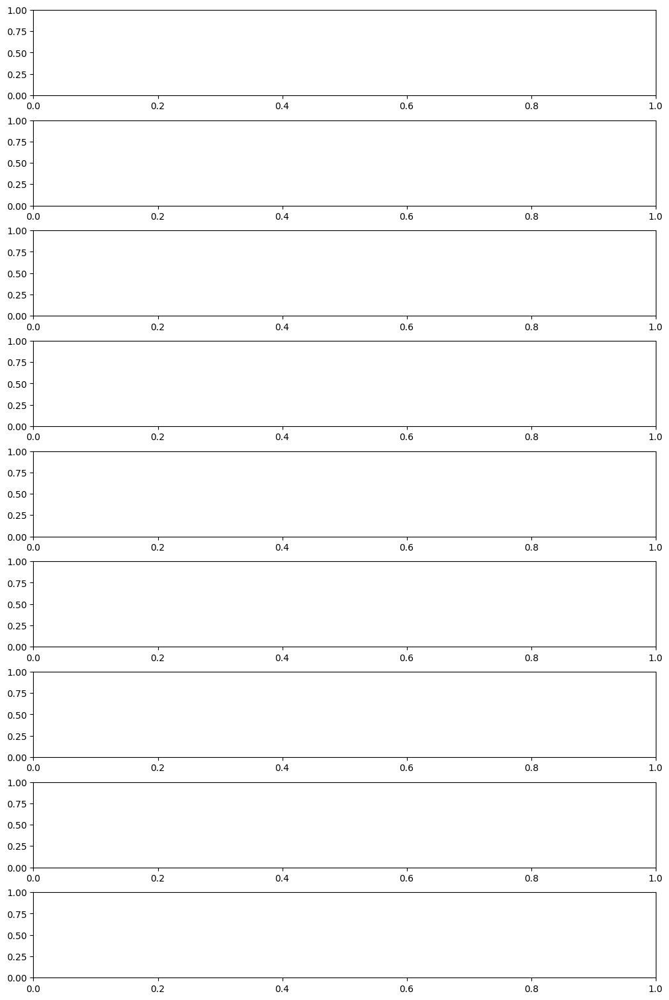

Start : Esse comando n�o pode ser executado devido ao erro: O sistema n�o pode encontrar o arquivo especificado.
No linha:1 caractere:1
+ Start "file:///home/william/Plots/results_local_NrMmtc_SimPerScriptCa ...
+ ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
    + CategoryInfo          : InvalidOperation: (:) [Start-Process], InvalidOperationException
    + FullyQualifiedErrorId : InvalidOperationException,Microsoft.PowerShell.Commands.StartProcessCommand
 


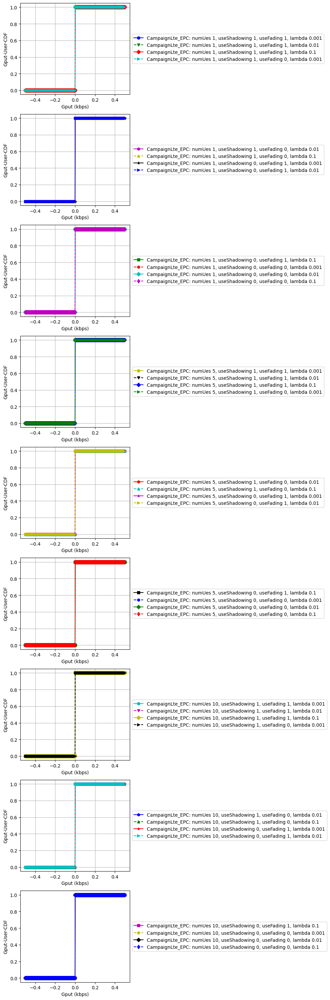

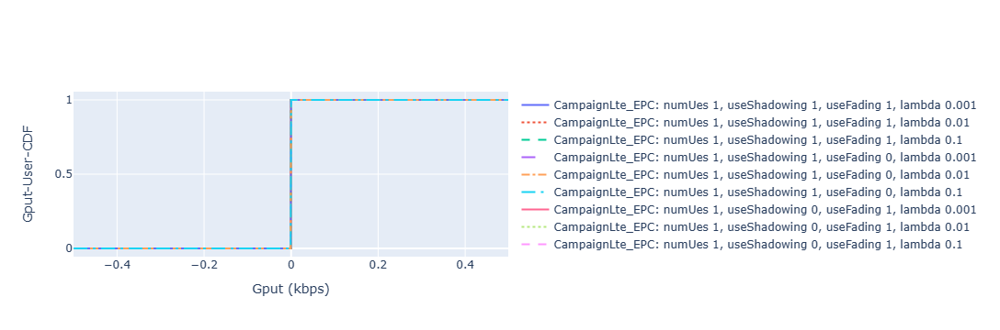

Graph:  Tput-User-CDF
Config.Plot:  3 0 0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
Start : Esse comando n�o pode ser executado devido ao erro: O sistema n�o pode encontrar o arquivo especificado.
No linha:1 caractere:1
+ Start "file:///home/william/Plots/results_local_NrMmtc_SimPerScriptCa ...
+ ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
    + CategoryInfo          : InvalidOperation: (:) [Start-Process], InvalidOperationException
    + FullyQualifiedErrorId : InvalidOperationException,Microsoft.PowerShell.Commands.StartProcessCommand
 


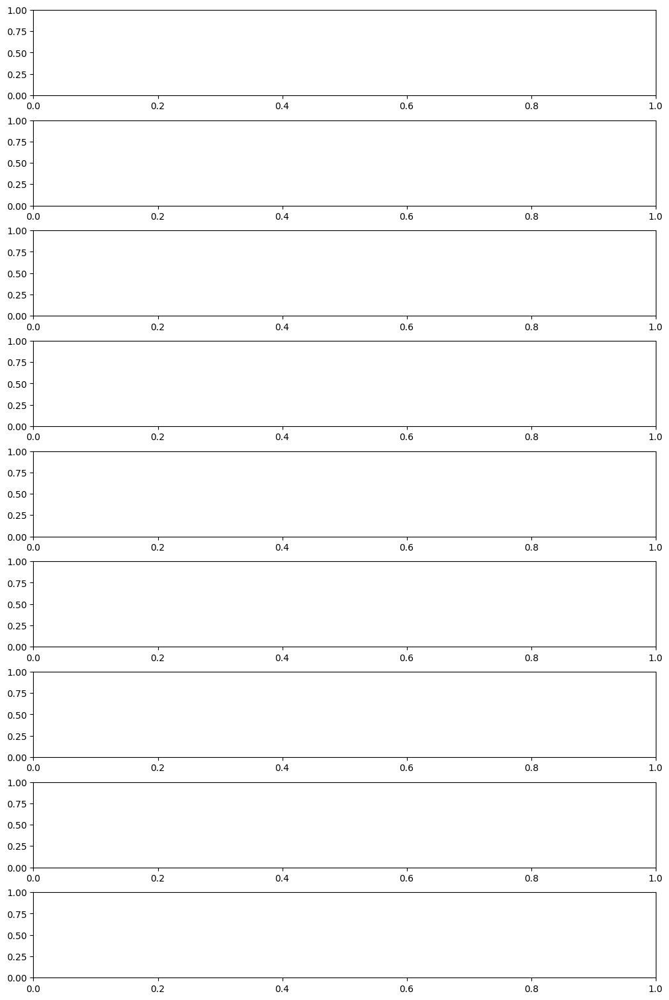

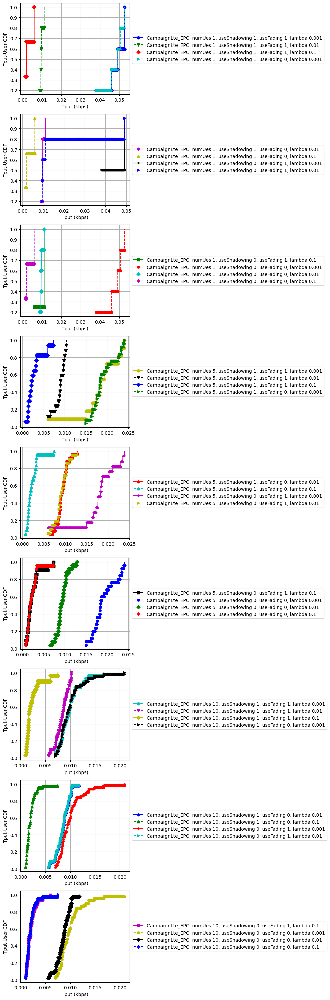

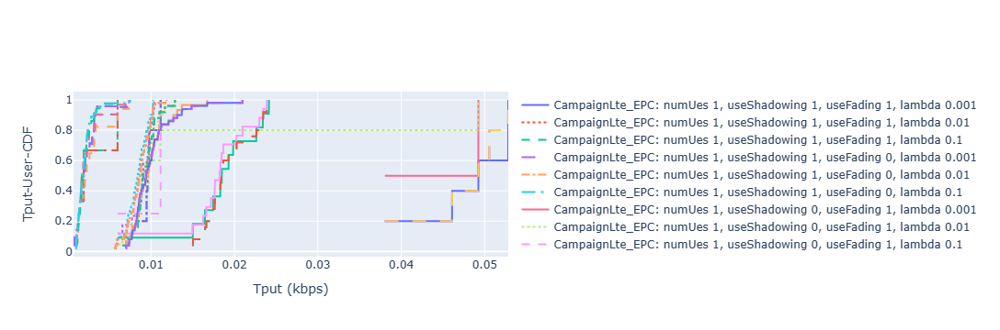

Graph:  MCS-User-CDF
Config.Plot:  3 0 0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
Start : Esse comando n�o pode ser executado devido ao erro: O sistema n�o pode encontrar o arquivo especificado.
No linha:1 caractere:1
+ Start "file:///home/william/Plots/results_local_NrMmtc_SimPerScriptCa ...
+ ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
    + CategoryInfo          : InvalidOperation: (:) [Start-Process], InvalidOperationException
    + FullyQualifiedErrorId : InvalidOperationException,Microsoft.PowerShell.Commands.StartProcessCommand
 


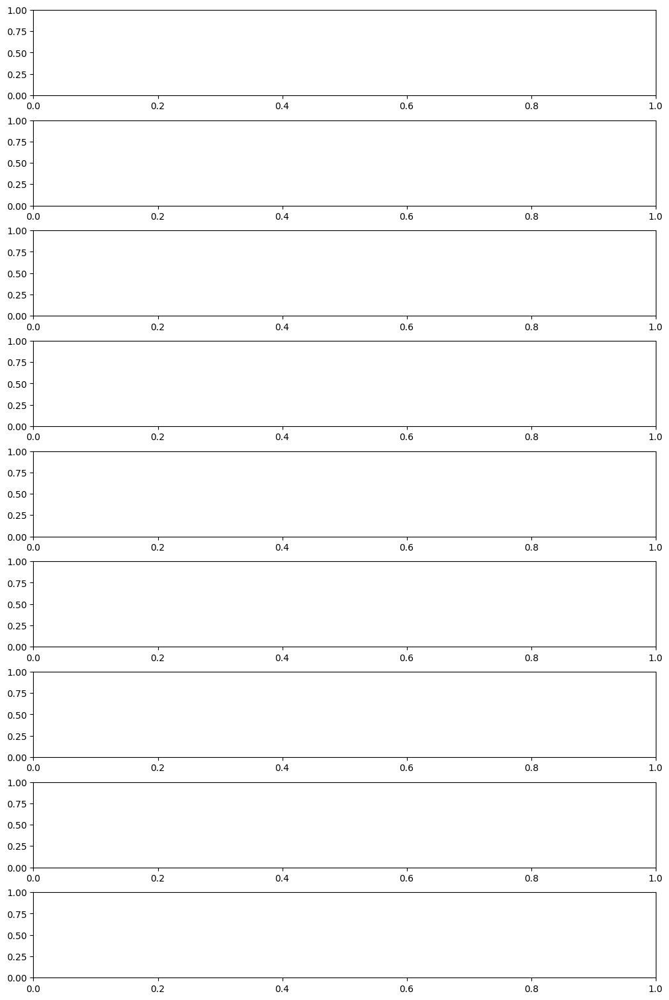

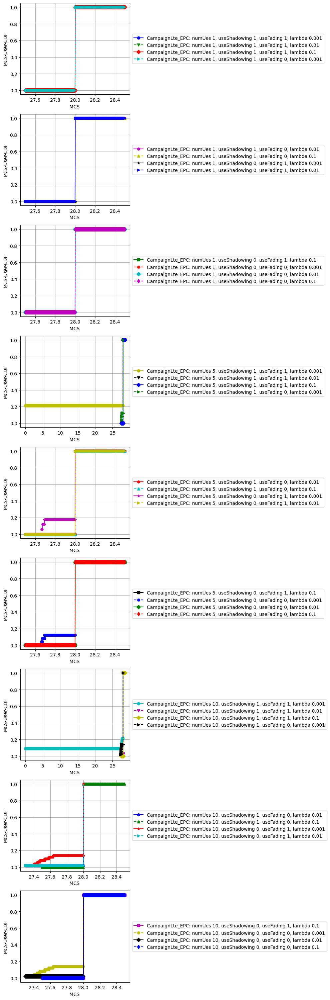

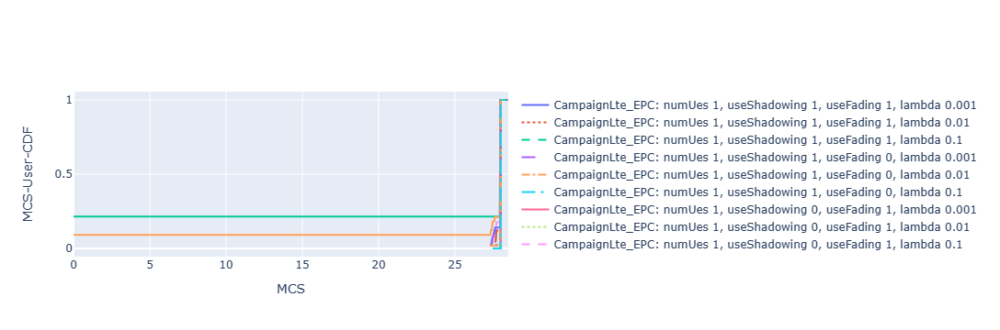

Graph:  Harq-User-CDF
Config.Plot:  3 0 0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
Start : Esse comando n�o pode ser executado devido ao erro: O sistema n�o pode encontrar o arquivo especificado.
No linha:1 caractere:1
+ Start "file:///home/william/Plots/results_local_NrMmtc_SimPerScriptCa ...
+ ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
    + CategoryInfo          : InvalidOperation: (:) [Start-Process], InvalidOperationException
    + FullyQualifiedErrorId : InvalidOperationException,Microsoft.PowerShell.Commands.StartProcessCommand
 


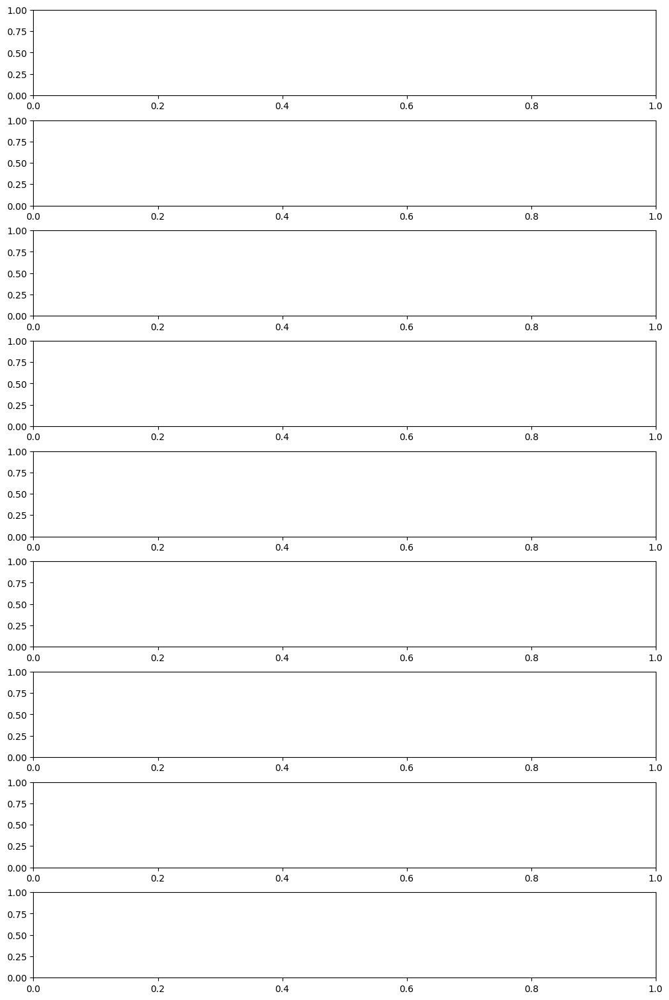

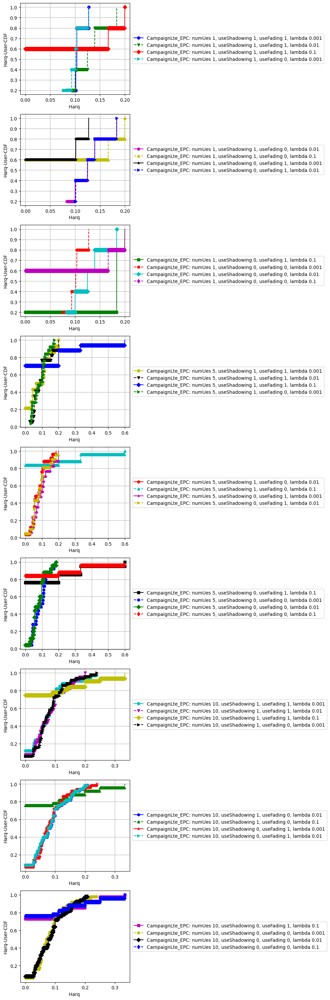

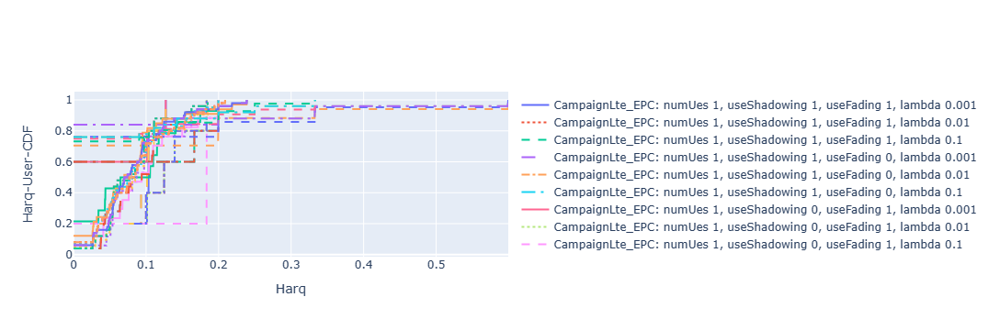

Graph:  Gput-User
Config.Plot:  3 0 0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


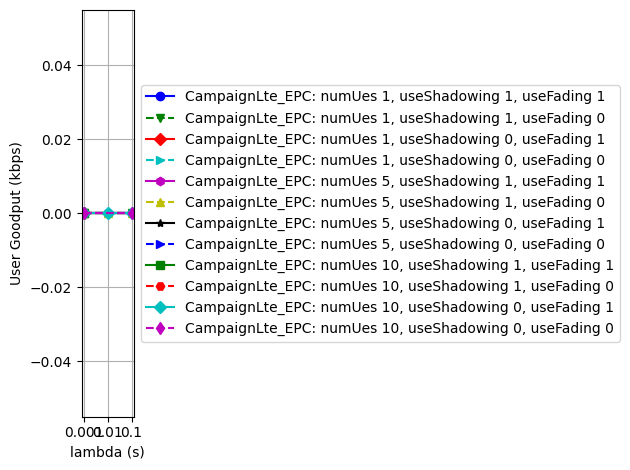

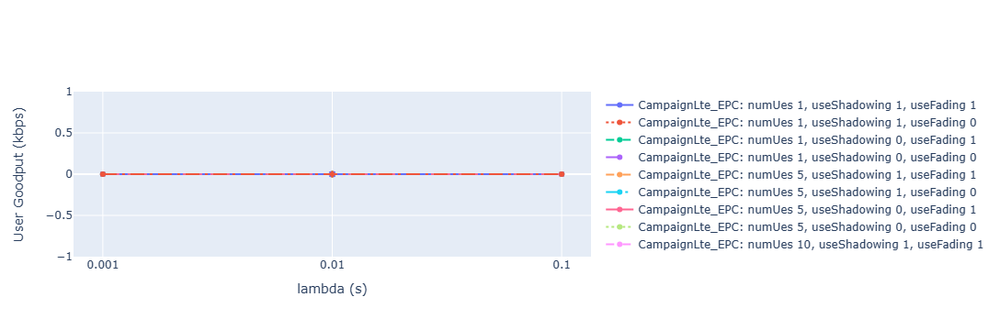

Graph:  Tput-User
Config.Plot:  3 0 0


Start : Esse comando n�o pode ser executado devido ao erro: O sistema n�o pode encontrar o arquivo especificado.
No linha:1 caractere:1
+ Start "file:///home/william/Plots/results_local_NrMmtc_SimPerScriptCa ...
+ ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
    + CategoryInfo          : InvalidOperation: (:) [Start-Process], InvalidOperationException
    + FullyQualifiedErrorId : InvalidOperationException,Microsoft.PowerShell.Commands.StartProcessCommand
 
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


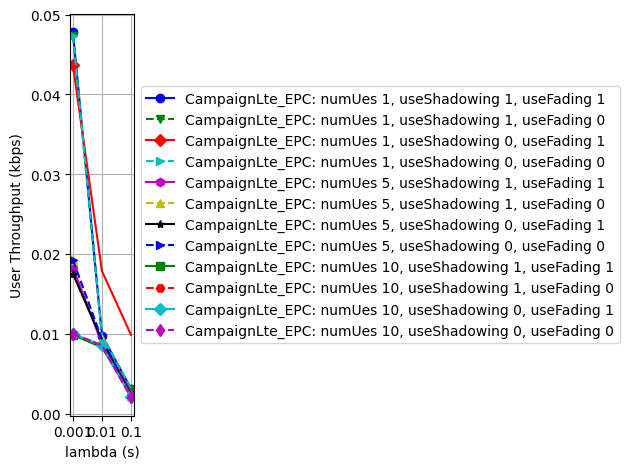

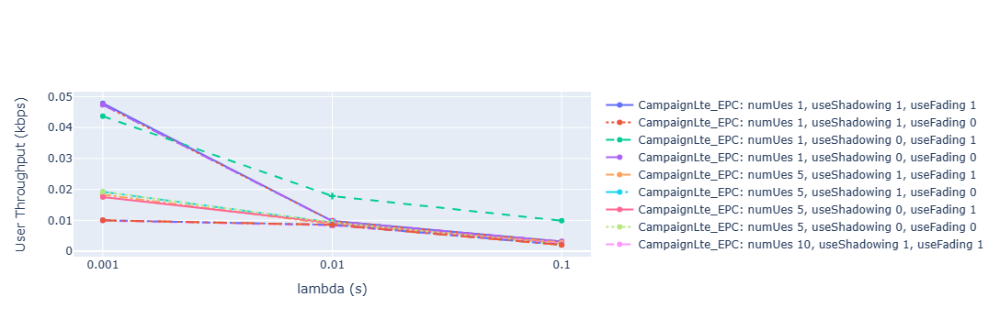

Graph:  MCS-User
Config.Plot:  3 0 0


Start : Esse comando n�o pode ser executado devido ao erro: O sistema n�o pode encontrar o arquivo especificado.
No linha:1 caractere:1
+ Start "file:///home/william/Plots/results_local_NrMmtc_SimPerScriptCa ...
+ ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
    + CategoryInfo          : InvalidOperation: (:) [Start-Process], InvalidOperationException
    + FullyQualifiedErrorId : InvalidOperationException,Microsoft.PowerShell.Commands.StartProcessCommand
 
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


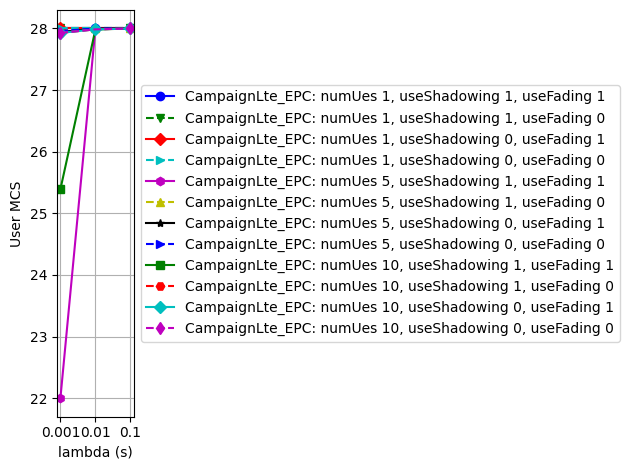

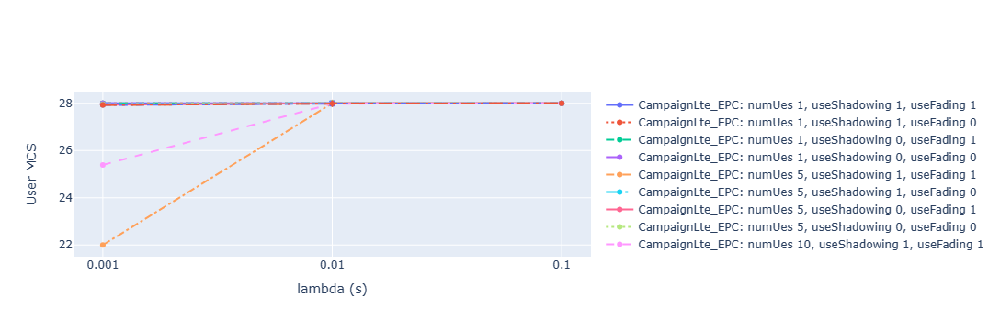

Graph:  Harq-User
Config.Plot:  3 0 0


Start : Esse comando n�o pode ser executado devido ao erro: O sistema n�o pode encontrar o arquivo especificado.
No linha:1 caractere:1
+ Start "file:///home/william/Plots/results_local_NrMmtc_SimPerScriptCa ...
+ ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
    + CategoryInfo          : InvalidOperation: (:) [Start-Process], InvalidOperationException
    + FullyQualifiedErrorId : InvalidOperationException,Microsoft.PowerShell.Commands.StartProcessCommand
 
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


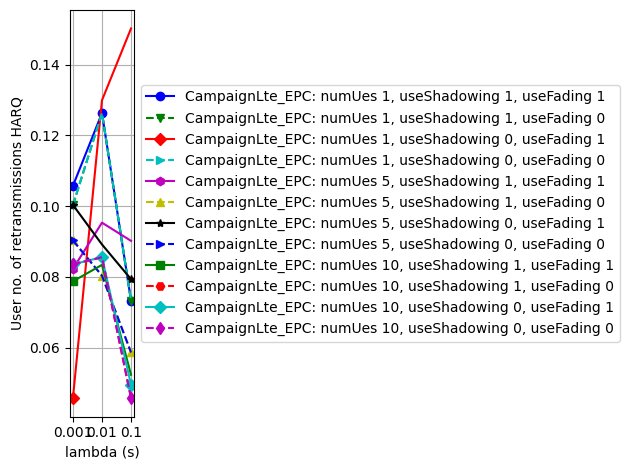

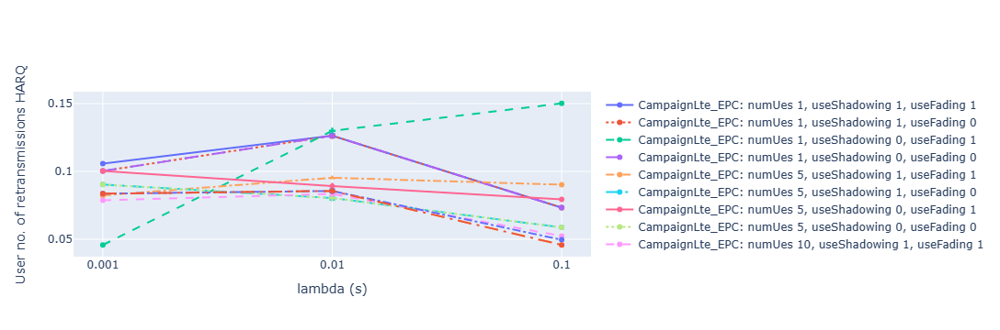

Start : Esse comando n�o pode ser executado devido ao erro: O sistema n�o pode encontrar o arquivo especificado.
No linha:1 caractere:1
+ Start "file:///home/william/Plots/results_local_NrMmtc_SimPerScriptCa ...
+ ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
    + CategoryInfo          : InvalidOperation: (:) [Start-Process], InvalidOperationException
    + FullyQualifiedErrorId : InvalidOperationException,Microsoft.PowerShell.Commands.StartProcessCommand
 


In [3]:
#Linux:
%cd $opath"ScriptsPlot"
%run PlotCampaignScript -b '1' -s "30" -j "5" -g "User" -l "PHY" -m "All" -f "NrMmtc_SimPerScriptCampaign_SimTest.yaml" -p $opath"results_local_NrMmtc_SimPerScriptCampaign_SimTest_lambda"

## Plots

### Plot 2/1/2 - 1 Campaign

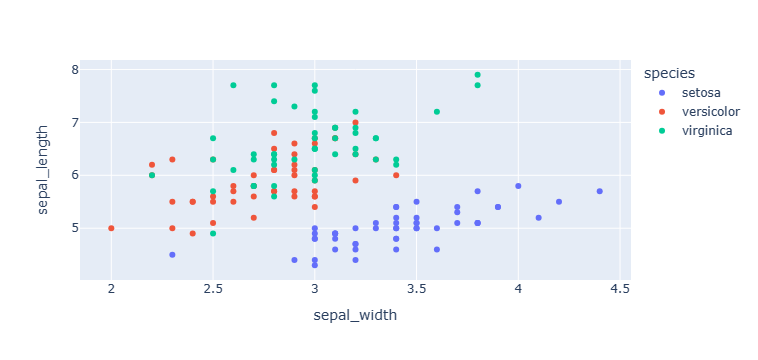

Start : Esse comando n�o pode ser executado devido ao erro: O sistema n�o pode encontrar o arquivo especificado.
No linha:1 caractere:1
+ Start "file:///home/william/Plots/results_local_NrMmtc_SimPerScriptCa ...
+ ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
    + CategoryInfo          : InvalidOperation: (:) [Start-Process], InvalidOperationException
    + FullyQualifiedErrorId : InvalidOperationException,Microsoft.PowerShell.Commands.StartProcessCommand
 


In [31]:
import plotly.express as px
df = px.data.iris()
fig = px.scatter(df, x="sepal_width", y="sepal_length", color="species")
fig.show()
